In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import re
import utils
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore")

import logging
from prophet import Prophet
from datetime import datetime, time, timedelta
from multiprocessing import cpu_count, Pool
import pycountry

## Upload all Data

In [2]:
dataT = pd.read_csv(r'/Users/edgartome_1/IronHack/IronProjects/Final_project/Original_Data_Code/extract.csv')
dataT.head()

,city,type,provider,ts,nb_trip,rain,snow,main,time_lost,before_lag,nb_vehic_avail
0,aarhus,CAR,32,2021-05-11T10:00:00Z,7,NaN,NaN,NaN,0.0,0,88.0
1,aarhus,CAR,32,2021-05-11T11:00:00Z,15,NaN,NaN,NaN,0.0,0,88.0
2,aarhus,CAR,32,2021-05-11T12:00:00Z,25,NaN,NaN,NaN,0.0,0,88.0
3,aarhus,CAR,32,2021-05-11T13:00:00Z,16,NaN,NaN,NaN,0.0,0,88.0
4,aarhus,CAR,32,2021-05-11T14:00:00Z,16,NaN,NaN,NaN,0.0,0,88.0


In [3]:
dataT.columns

Index(['city', 'type', 'provider', 'ts', 'nb_trip', 'rain', 'snow', 'main',
       'time_lost', 'before_lag', 'nb_vehic_avail'],
      dtype='object')

In [4]:
#How many citys

print('Name of the citys', dataT.city.unique())
print('Number of citys', dataT.city.nunique())

Name of the citys ['aarhus' 'amsterdam' 'antwerp' 'barcelona' 'bari' 'berlin' 'bilbao'
 'bonn' 'bordeaux' 'bratislava' 'bremen' 'bristol' 'bruxelles' 'budapest'
 'delft' 'dortmund' 'dublin' 'dusseldorf' 'eindhoven' 'enschede' 'essen'
 'frankfurt' 'gdansk' 'geneva' 'gothenburg' 'haarlem' 'hamburg' 'hanover'
 'heilbronn' 'helsingborg' 'helsinki' 'istanbul' 'karlsruhe' 'koln'
 'leipzig' 'lisbon' 'ljubljana' 'london' 'lubeck' 'lund' 'lyon' 'madrid'
 'malmo' 'milano' 'modena' 'munchen' 'munster' 'nice' 'norrkoping'
 'nuremberg' 'odense' 'orebro' 'oslo' 'paris' 'pisa' 'potsdam' 'prague'
 'reggio_emilia' 'riga' 'rome' 'rotterdam' 'seville' 'stockholm' 'tallinn'
 'the_hague' 'tilburg' 'torino' 'trondheim' 'vilnius' 'warsaw'
 'washington' 'wien' 'winterthur' 'zurich' 'zwolle']
Number of citys 75


In [5]:
#How many types sharing

print('Name of types sharing', dataT.type.unique())
print('Number of types sharing', dataT.type.nunique())

Name of types sharing ['CAR' 'BIKE' 'MOTORSCOOTER' 'SCOOTER']
Number of types sharing 4


In [6]:
#How many types of providers

print('Name of the provider', dataT.provider.unique())
print('Number of provider', dataT.provider.nunique())

Name of the provider [32  7 41 42 21 35 47 51  6 44 23 22 53 30 26 25 37 10 46 20 34 39 45 19
 14  5  8  9 24 36 27 16 31 13  3 12 15 17 38  4 40 49 18  1 52 11  2 28
 48 29 43 50 33]
Number of provider 53


In [7]:
#Transform time that was in object to date time type
dataT['ts'] = pd.to_datetime(dataT['ts'], format='%Y/%m/%d %H:%M:%S')

In [8]:
#Fuction to remove time zone

def time_n_zone(data):
    data['ts'] = data['ts'].astype(str)
    ogdata = list(data['ts'])
    newtime = []
    for time in ogdata:
        time = time[:-6]
        newtime.append(time)
    data['ts'] = newtime
    data['ts'] = data['ts'].apply(pd.to_datetime)

In [9]:
#Select data by city, type and provider. Change column names of ds to ts and nb_vehic_avail to y

def subsetDataFrame(city, type_s, provider_num):
    DataFrame = dataT[(dataT['city'] == city) & (dataT['type'] == type_s) & (dataT['provider'] == provider_num)]
    #del DataFrame['Unnamed: 0']
    time_n_zone(DataFrame)
    DataFrame.rename(columns = {'ts':'ds', 'nb_trip':'y'}, inplace = True)
    DataFrame = DataFrame.drop(['city', 'type', 'provider'], axis=1)
    le = LabelEncoder()
    DataFrame['main'] = le.fit_transform(DataFrame.main.values)
    return DataFrame

### Define new data for city, type of sharing and provider

In [10]:
data = subsetDataFrame('lisbon', 'BIKE', 13)
data

,ds,y,rain,snow,main,time_lost,before_lag,nb_vehic_avail
417510,2021-04-21 11:00:00,77,0.00,0.0,1,0.0,0,0.0
417511,2021-04-21 12:00:00,117,0.00,0.0,0,0.0,0,0.0
417512,2021-04-21 13:00:00,146,0.00,0.0,1,0.0,0,0.0
417513,2021-04-21 14:00:00,126,0.00,0.0,0,0.0,0,0.0
417514,2021-04-21 15:00:00,66,0.19,0.0,7,0.0,0,0.0
...,...,...,...,...,...,...,...,...
438517,2022-07-03 00:00:00,0,0.00,0.0,1,0.0,0,NaN
438518,2022-07-03 01:00:00,0,0.00,0.0,1,0.0,0,NaN
438519,2022-07-03 02:00:00,0,0.00,0.0,0,0.0,0,NaN
438520,2022-07-03 03:00:00,0,0.00,0.0,0,0.0,0,NaN


### EDA of Data

In [11]:
# Any missing data to remove, our fill
data.isnull().sum()

ds                 0
y                  0
rain               2
snow               2
main               0
time_lost          0
before_lag         0
nb_vehic_avail    58
dtype: int64

In [12]:
#Fill missing values with near values
for col in ['rain','snow','main','nb_vehic_avail']:
        data[col] = data[col].ffill()
        data[col] = data[col].bfill()

In [13]:
#Check
data.isnull().sum()

ds                0
y                 0
rain              0
snow              0
main              0
time_lost         0
before_lag        0
nb_vehic_avail    0
dtype: int64

In [14]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21012 entries, 417510 to 438521
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   ds              21012 non-null  datetime64[ns]
 1   y               21012 non-null  int64         
 2   rain            21012 non-null  float64       
 3   snow            21012 non-null  float64       
 4   main            21012 non-null  int64         
 5   time_lost       21012 non-null  float64       
 6   before_lag      21012 non-null  int64         
 7   nb_vehic_avail  21012 non-null  float64       
dtypes: datetime64[ns](1), float64(4), int64(3)
memory usage: 1.4 MB


In [15]:
data.head()

,ds,y,rain,snow,main,time_lost,before_lag,nb_vehic_avail
417510,2021-04-21 11:00:00,77,0.00,0.0,1,0.0,0,0.0
417511,2021-04-21 12:00:00,117,0.00,0.0,0,0.0,0,0.0
417512,2021-04-21 13:00:00,146,0.00,0.0,1,0.0,0,0.0
417513,2021-04-21 14:00:00,126,0.00,0.0,0,0.0,0,0.0
417514,2021-04-21 15:00:00,66,0.19,0.0,7,0.0,0,0.0


In [16]:
#What does each column mean?
data.describe().T

,count,mean,std,min,25%,50%,75%,max
y,21012.0,155.547877,122.428724,0.0,48.0,143.0,230.0,670.00
rain,21012.0,0.028057,0.307428,0.0,0.0,0.0,0.0,19.64
snow,21012.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.00
main,21012.0,0.834476,1.278696,0.0,0.0,1.0,1.0,9.00
time_lost,21012.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.00
before_lag,21012.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.00
nb_vehic_avail,21012.0,305.772321,442.173457,0.0,0.0,0.0,889.0,1044.00


In [17]:
#Quantitie of outliers
numcol = list(data.describe().columns)

for x in numcol:
    Q3 = data[x].quantile(0.75)
    Q1= data[x].quantile(0.25)
    IQR = Q3 - Q1
    filters = data[data[x]>Q3 + 1.5*IQR]
    print('Column', x)
    print('Number of outliers', len(filters))
    print('Percentage of outliers', "{:.1f}".format((len(filters)/len(data[x]))*100))
    print('\n')

Column y
Number of outliers 196
Percentage of outliers 0.9


Column rain
Number of outliers 952
Percentage of outliers 4.5


Column snow
Number of outliers 0
Percentage of outliers 0.0


Column main
Number of outliers 978
Percentage of outliers 4.7


Column time_lost
Number of outliers 0
Percentage of outliers 0.0


Column before_lag
Number of outliers 0
Percentage of outliers 0.0


Column nb_vehic_avail
Number of outliers 0
Percentage of outliers 0.0




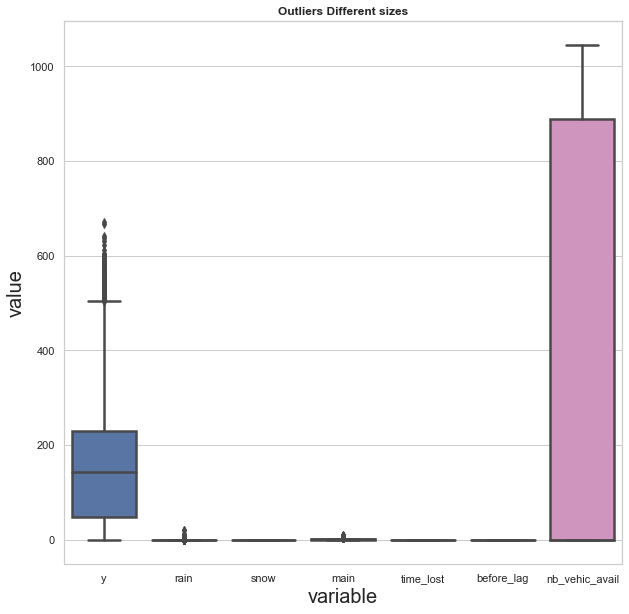

In [18]:
fig = plt.figure(figsize=(10,10))

sns.set_theme(style="whitegrid")

plt.title('Outliers Different sizes', fontweight='bold')

plt.xlabel("variable", fontsize = 20)
plt.ylabel("value", fontsize = 20)

sns.boxplot(data=data, linewidth=2.5)

plt.show()

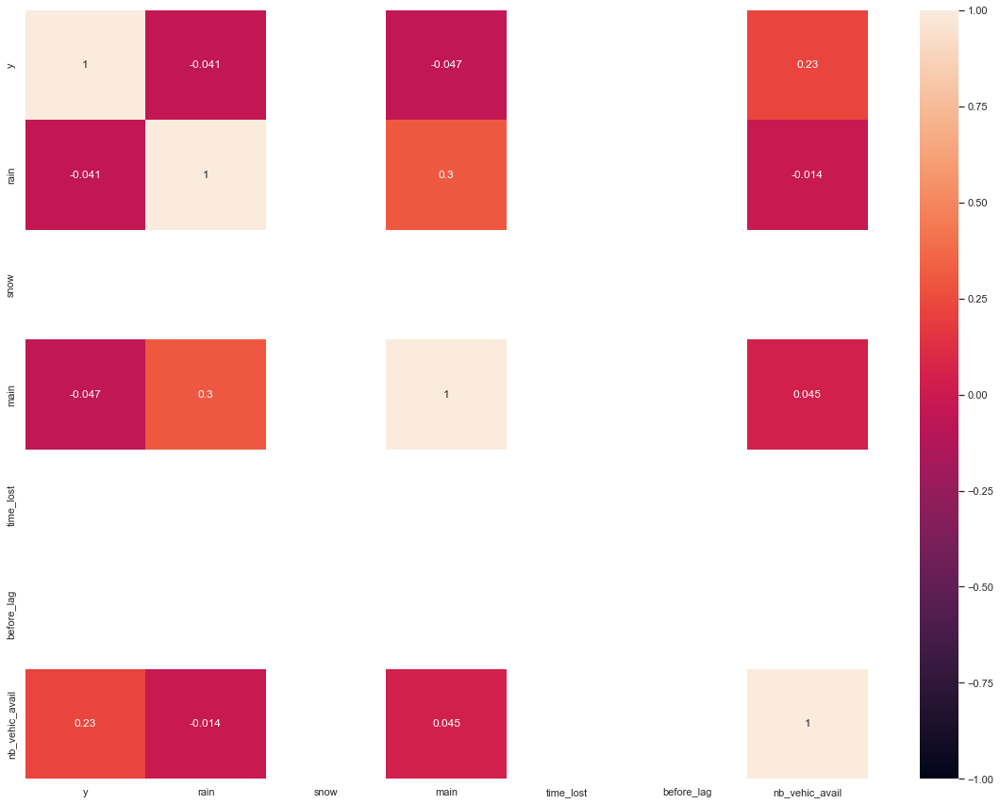

In [19]:
# Column collinearity - any high correlations?

plt.figure(figsize=(20, 15))

heatmap = sns.heatmap(data.corr(), vmin=-1, vmax=1, annot=True)

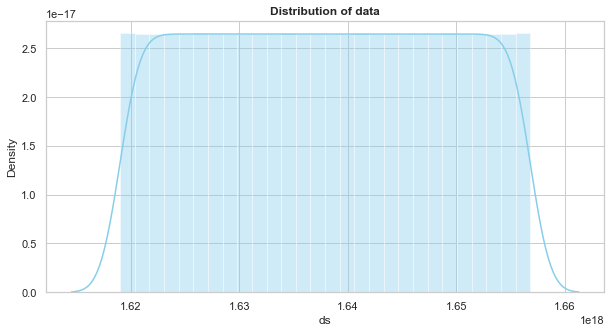

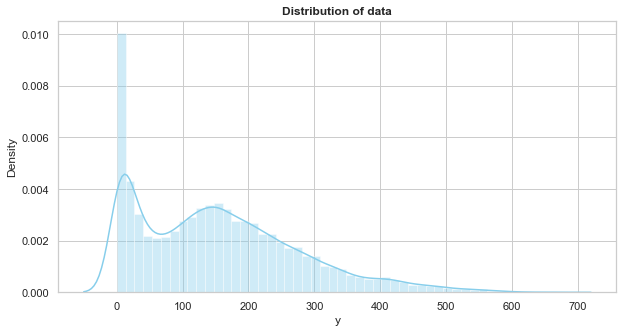

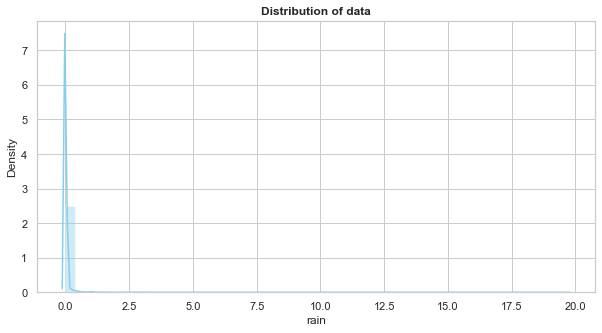

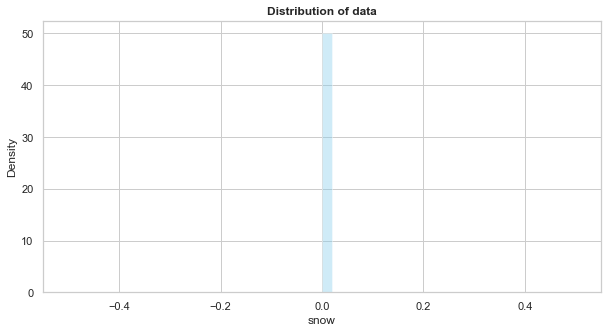

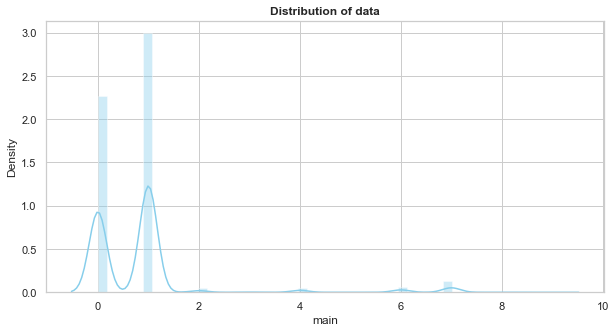

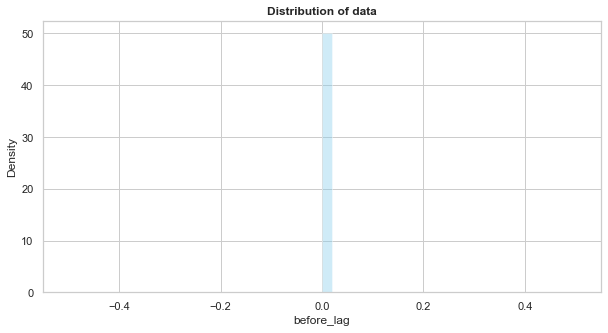

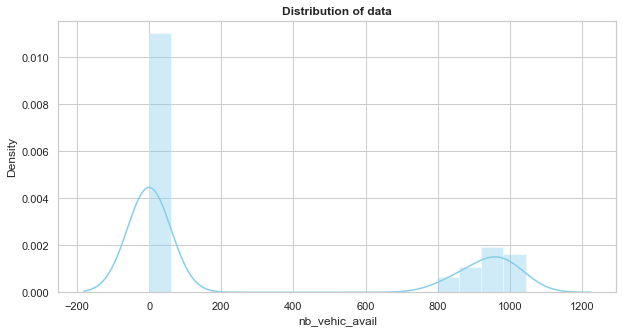

In [20]:
#Plot distribution of data of columns with numerical values
colum = ['ds','y', 'rain', 'snow', 'main', 'before_lag', 'nb_vehic_avail']
#colum = ['y', 'rain', 'snow', 'main', 'before_lag', 'nb_vehic_avail']
for col in colum:
    f, axes = plt.subplots(figsize=(10, 5), sharex=True)
    plt.title('Distribution of data', fontweight='bold')
    sns.distplot(data[col],hist=True, color="skyblue")
    plt.xlabel(col)
    plt.show()

In [21]:
data.to_csv(r'/Users/edgartome_1/IronHack/IronProjects/Final_project/Data clean/clean_data_portugal_lisboa_bike.csv')

## Aplye model Prhofet

In [22]:
x = len(data) - len(data)*0.8
x

4202.399999999998

In [23]:
#Train data set
data_train = data[:-4202]
data_train


,ds,y,rain,snow,main,time_lost,before_lag,nb_vehic_avail
417510,2021-04-21 11:00:00,77,0.00,0.0,1,0.0,0,0.0
417511,2021-04-21 12:00:00,117,0.00,0.0,0,0.0,0,0.0
417512,2021-04-21 13:00:00,146,0.00,0.0,1,0.0,0,0.0
417513,2021-04-21 14:00:00,126,0.00,0.0,0,0.0,0,0.0
417514,2021-04-21 15:00:00,66,0.19,0.0,7,0.0,0,0.0
...,...,...,...,...,...,...,...,...
434315,2022-01-08 22:00:00,115,0.00,0.0,0,0.0,0,0.0
434316,2022-01-08 23:00:00,132,0.00,0.0,0,0.0,0,0.0
434317,2022-01-09 00:00:00,103,0.00,0.0,0,0.0,0,0.0
434318,2022-01-09 01:00:00,65,0.00,0.0,0,0.0,0,0.0


In [24]:
#Test data set
data_test = data[-4202:]
data_test

,ds,y,rain,snow,main,time_lost,before_lag,nb_vehic_avail
434320,2022-01-09 03:00:00,0,0.0,0.0,1,0.0,0,0.0
434321,2022-01-09 04:00:00,19,0.0,0.0,1,0.0,0,0.0
434322,2022-01-09 05:00:00,12,0.0,0.0,1,0.0,0,0.0
434323,2022-01-09 06:00:00,21,0.0,0.0,1,0.0,0,0.0
434324,2022-01-09 07:00:00,13,0.0,0.0,1,0.0,0,0.0
...,...,...,...,...,...,...,...,...
438517,2022-07-03 00:00:00,0,0.0,0.0,1,0.0,0,988.0
438518,2022-07-03 01:00:00,0,0.0,0.0,1,0.0,0,988.0
438519,2022-07-03 02:00:00,0,0.0,0.0,0,0.0,0,988.0
438520,2022-07-03 03:00:00,0,0.0,0.0,0,0.0,0,988.0


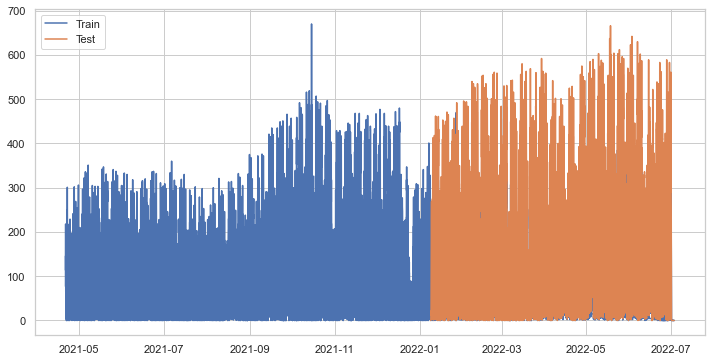

In [25]:
from matplotlib.pylab import rcParams

rcParams['figure.figsize']=12,6

#plotting the data
plt.plot(data_train['ds'],data_train['y'], label='Train')
plt.plot(data_test['ds'],data_test['y'], label='Test')
plt.legend()

In [26]:
#Aplly model

def fit_model(DATA, COUNTRY):
    m = Prophet(seasonality_mode='multiplicative', yearly_seasonality = True, changepoint_range=0.95)

    # GET COUNTRY CODE AND ADD PROPHET HOLIDAYS

    #COUNTRY = 'DENMARK'
    country_info = pycountry.countries.get(name=COUNTRY.replace("_"," ")) or pycountry.countries.get(official_name=COUNTRY.replace("_"," ")) or pycountry.countries.get(alpha_3=COUNTRY)
    m.add_country_holidays(country_name=country_info.alpha_2)
    
    
    # ADD REGRESSORS

    for reg in [e for e in list(DATA.columns) if e not in ('ds','y')]:
        m.add_regressor(reg)


    m.fit(DATA)
    return m

In [27]:
m = fit_model(data_train, 'PORTUGAL')

Initial log joint probability = -382.694
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33818.4    0.00369649       1512.02      0.7011     0.07011      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33873.2    0.00361607       2162.35           1           1      240   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       33890.1   0.000993581        282.87           1           1      359   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33918.4    0.00312108       441.459      0.1828      0.7815      471   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33929.2    0.00287273       389.012      0.9484      0.9484      588   
    Iter      log prob        ||dx||      ||grad||       alpha  

In [28]:
#To use forecast = m.predict(future), have to add future values of (rain,snow,main,time_lost,before_lag,nb_vehic_avail)
#Our use the model wihtout the regressoers for (rain,snow,main,time_lost,before_lag,nb_vehic_avail)

forecast = m.predict(data_test)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
4197,2022-07-03 00:00:00,33.178380,-35.589820,98.811654
4198,2022-07-03 01:00:00,22.045440,-47.282331,90.400090
4199,2022-07-03 02:00:00,7.462647,-56.589279,72.368827
4200,2022-07-03 03:00:00,-9.856648,-83.426650,62.589895
4201,2022-07-03 04:00:00,-17.603475,-86.423356,53.842875


In [29]:
forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,Ano Novo,Ano Novo_lower,Ano Novo_upper,Assunção de Nossa Senhora,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,additive_terms,additive_terms_lower,additive_terms_upper,yhat
0,2022-01-09 03:00:00,136.563615,-123.312558,10.766479,136.563615,136.563615,0.0,0.0,0.0,0.0,...,-0.285564,-0.285564,-0.285564,-0.086332,-0.086332,-0.086332,0.0,0.0,0.0,-54.124323
1,2022-01-09 04:00:00,136.575026,-135.781634,-3.449232,136.575026,136.575026,0.0,0.0,0.0,0.0,...,-0.288185,-0.288185,-0.288185,-0.085775,-0.085775,-0.085775,0.0,0.0,0.0,-69.665022
2,2022-01-09 05:00:00,136.586438,-121.960769,9.612972,136.586438,136.586438,0.0,0.0,0.0,0.0,...,-0.289708,-0.289708,-0.289708,-0.085217,-0.085217,-0.085217,0.0,0.0,0.0,-53.285416
3,2022-01-09 06:00:00,136.597849,-74.318602,56.478742,136.597849,136.597849,0.0,0.0,0.0,0.0,...,-0.290118,-0.290118,-0.290118,-0.084660,-0.084660,-0.084660,0.0,0.0,0.0,-8.904617
4,2022-01-09 07:00:00,136.609260,-23.060517,113.596393,136.609260,136.609260,0.0,0.0,0.0,0.0,...,-0.289413,-0.289413,-0.289413,-0.084102,-0.084102,-0.084102,0.0,0.0,0.0,45.441229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4197,2022-07-03 00:00:00,68.398895,-35.589820,98.811654,68.398895,68.398895,0.0,0.0,0.0,0.0,...,-0.271344,-0.271344,-0.271344,0.010665,0.010665,0.010665,0.0,0.0,0.0,33.178380
4198,2022-07-03 01:00:00,68.271314,-47.282331,90.400090,68.271314,68.271314,0.0,0.0,0.0,0.0,...,-0.277111,-0.277111,-0.277111,0.010592,0.010592,0.010592,0.0,0.0,0.0,22.045440
4199,2022-07-03 02:00:00,68.143733,-56.589279,72.368827,68.143733,68.143733,0.0,0.0,0.0,0.0,...,-0.281863,-0.281863,-0.281863,0.010519,0.010519,0.010519,0.0,0.0,0.0,7.462647
4200,2022-07-03 03:00:00,68.016153,-83.426650,62.589895,68.016153,68.016153,0.0,0.0,0.0,0.0,...,-0.285564,-0.285564,-0.285564,0.010448,0.010448,0.010448,0.0,0.0,0.0,-9.856648


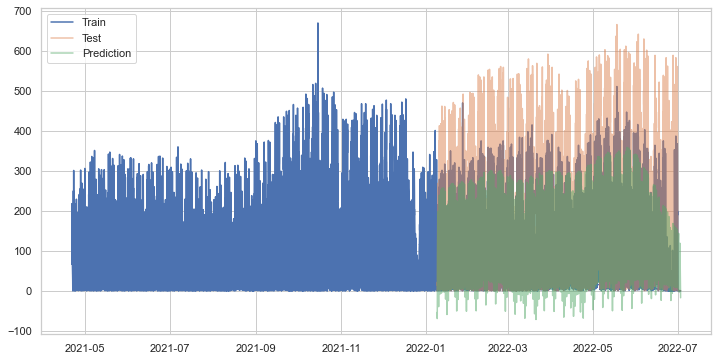

In [30]:
#Plot the train and test data on top the forecast
plt.plot(data_train.set_index('ds')['y'], label='Train')
plt.plot(data_test.set_index('ds')['y'], label='Test',alpha=0.5)
plt.plot(forecast.set_index('ds')['yhat'], label='Prediction',alpha=0.5)
plt.legend()

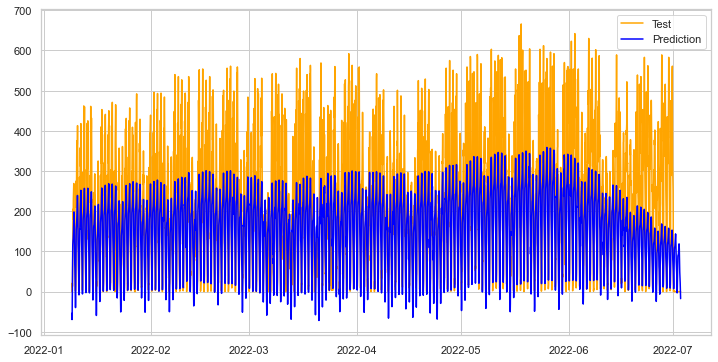

In [31]:
#Plot data test and prediction
fig, ax = plt.subplots()
plt.plot(data_test.set_index('ds')['y'], label='Test',color='orange')
plt.plot(forecast.set_index('ds')['yhat'], label='Prediction',color='blue')
plt.legend()

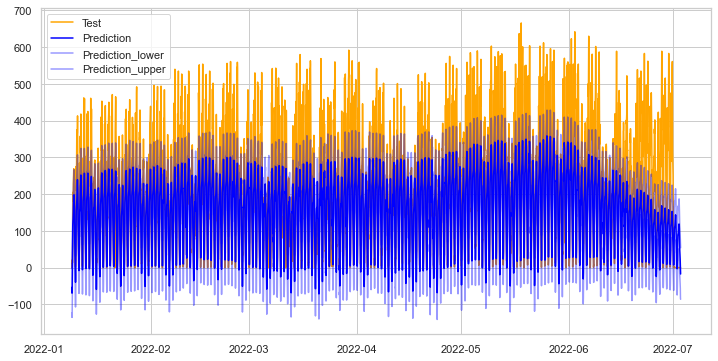

In [32]:
#Plot data test and prediction
fig, ax = plt.subplots()
plt.plot(data_test.set_index('ds')['y'], label='Test',color='orange')
plt.plot(forecast.set_index('ds')['yhat'], label='Prediction',color='blue')
lower=plt.plot(forecast.set_index('ds')['yhat_lower'], label='Prediction_lower',alpha=0.4,color='blue')
upper=plt.plot(forecast.set_index('ds')['yhat_upper'], label='Prediction_upper',alpha=0.4,color='blue')
plt.legend()

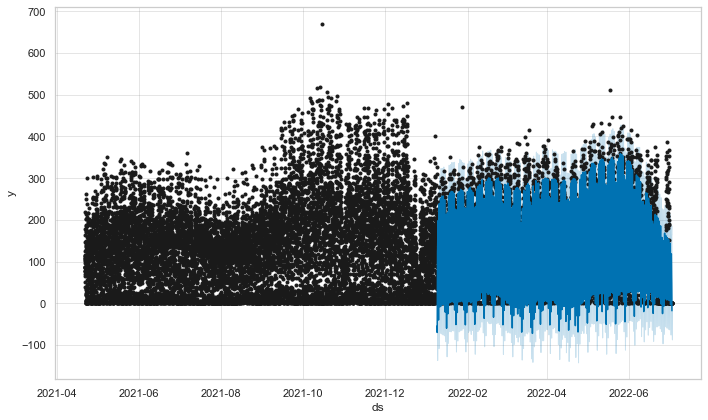

In [33]:
fig1 = m.plot(forecast)

In [34]:
from prophet.plot import plot_plotly, plot_components_plotly

plot_plotly(m, forecast)

In [35]:
plot_components_plotly(m, forecast)

## Test model - Cross validation

In [36]:
len(data_test['y'])


4202

In [37]:
len(forecast['yhat'])

4202

In [38]:
#calculate Root Mean Square  Error(RMSE)
from math import sqrt
from sklearn.metrics import mean_squared_error

rms = sqrt(mean_squared_error(data_test['y'],forecast['yhat']))

print('The root mean square error score for the model is: ', rms)

The root mean square error score for the model is:  119.32641844763194


In [39]:
#calculate Mean Absolute Error(MAE)
from math import sqrt
from sklearn.metrics import mean_squared_error

mae = mean_squared_error(data_test['y'],forecast['yhat'])

print('The mean absolute error score for the model is: ', mae)

The mean absolute error score for the model is:  14238.794139539355


In [40]:
#Coefficient of Determination or R^2
from sklearn.metrics import r2_score

r2 = r2_score(data_test['y'],forecast['yhat'])

print('The coefficient of determination of r2 score for the model is: ', r2)

The coefficient of determination of r2 score for the model is:  0.46359998166459315


In [41]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_absolute_percentage_error

y_true = data_test['y'].values
y_pred = forecast['yhat'].values

mae_01 = mean_absolute_error(y_true, y_pred)
mape_01 = mean_absolute_percentage_error(y_true, y_pred)

print('The mean absolute error for the model is: ', mae_01)
print('\n')
print('The mean absolute percentage error for the model is: ', mape_01)

The mean absolute error for the model is:  89.3005711881255


The mean absolute percentage error for the model is:  1.035903798534996e+16


In [42]:
days_train = data['ds'].iloc[16810] - data['ds'].iloc[0]
days_train

Timedelta('262 days 16:00:00')

In [43]:
days_test = data['ds'].iloc[21011] - data['ds'].iloc[16811]
days_test

Timedelta('175 days 00:00:00')

In [44]:
total_days = days_train + days_test
total_days

Timedelta('437 days 16:00:00')

In [45]:
import warnings
warnings.filterwarnings("ignore")

In [46]:
# Cross validation
#Train on the first 200 days, aply to next 5 days and loop each 5 days to reach final data
from prophet.diagnostics import cross_validation

df_cv = cross_validation(m, initial='200 days', period='5 days', horizon = '20 days', parallel="processes")

INFO:prophet:Making 44 forecasts with cutoffs between 2021-11-10 04:00:00 and 2022-06-13 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff729bef070>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -186.747
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -245.222
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -199.869
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -219.497
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -224.584
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -222.665
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -252.527
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -259.515
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       20835.3     0.0120069       978.504           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       20591.7    0.00155393       902.184      0.3412      0.3412      136   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       22559.8    0.00339994       1071.49      0.6972      0.6972      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       22130.4    0.00343205       484.861      0.8062      0.8062      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       21662.7    0.00350121       289.781           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha  

     499       23045.2   0.000385887       136.876      0.1328      0.4312      693   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       20872.8    0.00168946       662.447      0.4903           1      809   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       20618.7    0.00180542       517.942           1           1      868   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     575       22161.5   3.63007e-05       286.315   2.257e-07       0.001      805  LS failed, Hessian reset 
     599         22598   0.000301138        109.72           1           1      788   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       23501.8   0.000501955       219.704      0.8304      0.8304      711   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

    1199       20622.8    0.00144418       138.361           1           1     1575   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       22166.6    0.00400815       259.197           1           1     1441   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       23056.3   1.16175e-05       59.8116      0.3371           1     1365   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       20877.9   0.000609632        94.831      0.2201           1     1575   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       21267.2   9.70453e-05       229.894       0.209           1     1556   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       22603.8   0.000365671       124.151           1           1     1476   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1599       21269.1   8.61713e-05       92.6877      0.3457           1     2160   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       22170.4    0.00014746       150.376           1           1     2075   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1527       20882.3   2.70422e-06        61.818   4.357e-08       0.001     2236  LS failed, Hessian reset 
    1499       22605.9    0.00013004       199.915           1           1     2021   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       21705.4   1.28121e-05       46.7876      0.7098      0.7098     2107   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1401       23062.4    9.4237e-06       86.5031    4.67e-08       0.001     1963  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1512       22170.5   0.000106469       196.959   1.572e-06       0.001     2132  LS failed, Hessian reset 
    1573       20882.3   1.07824e-06       62.8745      0.0547           1     2298   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    1499       23513.7   6.65204e-06       203.872      0.5593      0.5593     1914   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1665       21269.1   1.93264e-06       59.9607      0.2533           1     2236   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1499       23062.6   3.69731e-05       150.884      0.8697      0.8697     2082   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1562       21705.6   6.45076e-06       81.1331   4.663e-08       0.001     2241  LS failed, Hessian reset 
    1599         22606    5.5269e-05       52.1573           1           1     2149   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1563       22170.5    6.6335e-06       91.7029   6.725e-08       0.001     2248  LS failed, Hessian reset 
    1570       22170.5    1.0037e-06       54.0231      0.3086           1     2256   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1599       23513.9   0.000758648         160.9           1           1     2031   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1597       21705.6   2.83239e-05       141.097   3.977e-07       0.001     2332  LS failed, Hessian reset 
    1599       21705.6   6.43896e-06       47.6148           1           1     2335   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1599       23062.8   0.000567675       74.5421      0.3324           1     2210   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1699         22606    9.7116e-05        52.929           1           1     2274   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1699       23514.1   0.000403852       157.432           1           1     2161   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -244.88
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1938       23514.6   1.05265e-05        85.894   1.487e-07       0.001     2512  LS failed, Hessian reset 
    1939       23514.6    3.7224e-06       39.1298           1           1     2513   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1999         21707   6.18229e-05       186.148      0.1402      0.1402     2885   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    2099       22615.5    0.00103754       292.284      0.2415           1     2786   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -271.796
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -250.365
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1999       23064.4   7.25865e-06       68.1482           1           1     2724   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2015       23064.4   3.80297e-06       63.1191      0.2945           1     2743   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
      99       23911.2    0.00185593       1513.64      0.3471      0.3471      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    2123       22615.8   5.70538e-06       113.498   5.845e-08       0.001     2872  LS failed, Hessian reset 
    2099       21708.7    0.00430426       1012.21           1           1     3017   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99         24336     0.0109192       2549.87      0.8579      0.8579      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -274.821
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24806.5     0.0121306       2941.29           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       23928.2    0.00349809       186.045           1           1      243   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2199       22615.9   0.000144446       127.649           1           1     2977   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2199       21709.8   0.000172806       189.769       1.537      0.1537     3147   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -261.565
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2499         21711      0.011264       340.736           1           1     3631   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       24400.3     0.0116854        566.22      0.7896      0.7896      593   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -279.782
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       25411.9   0.000520477       261.215      0.2586      0.2586      470   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2599       22617.3   4.37788e-06       83.4189      0.5052      0.5052     3498   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         24877     0.0468768       541.783           1           1      596   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     578       23947.7   8.93359e-05       368.861   3.996e-07       0.001      769  LS failed, Hessian reset 
    2640       22617.3   1.02854e-06       59.2874       0.454       0.454     3553   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    2599       21712.7    0.00264677       257.493           1           1     3755   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599         23948   0.000149836       66.8874           1           1      791   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       25870.9    0.00102065       538.776           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       24405.4   0.000258556       498.302      0.4079      0.4079      713   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       24884.3    0.00898108       312.388           1           1      706   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         25419    0.00057599       464.379     0.03826           1      592   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       26139.2    0.00252158       664.972           1           1      138   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2699       21714.6     0.0030495       302.435      0.6796     0.06796     3880   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       23950.1    0.00426018       564.276      0.6413      0.6413      912   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1199       24419.1    0.00371873       360.938           1           1     1493   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       23954.6    0.00500265       92.9704           1           1     1611   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -258.407
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3329       21722.5   2.91219e-06       103.129   3.416e-08       0.001     4780  LS failed, Hessian reset 
    1099       25436.5     0.0051348       171.558           1           1     1338   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099         24912   0.000968035       521.202      0.1339      0.1339     1491   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       26205.3    0.00203092    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1346       25441.4   2.12977e-05       175.067   2.705e-07       0.001     1688  LS failed, Hessian reset 
    1499       24430.8   0.000471447       102.713           1           1     1914   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     999       25965.2   0.000559617       590.672           1           1     1317   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       24915.4   1.50168e-05       156.418      0.7653      0.7653     1901   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       25441.6   0.000887618       131.152       2.708      0.2708     1763   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       26217.9    0.00107388       148.813           1           1     1271   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1590         23962   1.57392e-05       205.645   4.801e-08       0.001     2155  LS failed, Hessian reset 
     399       26451.4   0.000932012       93.6795      0.3035      0.3035      481   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1899         23963   9.93957e-05       60.1983     0.08393           1     2636   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -273.239
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       25993.8    0.00268513       750.095           1           1     1802   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       26234.2    0.00488293       100.464           1           1     1758   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1899       24432.5   0.000888855        95.683           1           1     2530   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       26499.5    0.00091608       384.109           1           1      973   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1911       24432.6   4.12503e-05       183.102   2.746e-07       0.001     2606  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1499       25996.8     0.0116125       556.711           1           1     1924   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         26645    0.00940475       792.844           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       26235.4   7.59677e-05       123.944      0.8305      0.8305     1890   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1899       24926.5    0.00643941       970.391      0.8207     0.08207     2607   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1899       25457.2     0.0126042       655.877           1           1     2440   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       26504.7   0.000615537       133.588           1           1     1099   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       26722.1     0.0194195       543.078           1           1      594   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1805       25999.4   3.06829e-06        74.138   4.147e-08       0.001     2421  LS failed, Hessian reset 
Initial log joint probability = -277.12
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2299       24433.5   1.61591e-05       83.0293      0.2389      0.2389     3171   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1786       26238.5   7.42187e-06       144.559   8.244e-08       0.001     2369  LS failed, Hessian reset 
    2187       25464.8   5.27558e-06       126.448   2.422e-08       0.001     2898  LS failed, Hessian reset 
    1799       26238.5   0.000141372       114.519           1           1     2385   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    2678       24943.1   2.14358e-06        72.631   1.638e-08       0.001     3666  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    2299       26006.2    0.00236526       522.848           1           1     3046   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       26780.1    0.00163337       393.004           1           1     1200   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2699       24943.2   3.07899e-05       277.401      0.6474      0.6474     3699   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       26971.9     0.0012872       597.157           1           1      603   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2191       26242.3   4.26939e-06       95.0486   2.379e-08       0.001     2991  LS failed, Hessian reset 
    2199       26242.4   0.000231116       141.022           1           1     3003   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    2571       25466.6   1.08908e-05       200.376   8.802e-08       0.001     3588  LS failed, Hessian reset 
    2599       25466.6   3.23409e-06       212.694      0.5079      0.5079     3629   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2399         26009   0.000127683       297.967      0.3408      0.3408     3168   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       26990.5    0.00240547        1071.8      0.1025           1      723   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       26788.4   0.000299108       631.573      0.3961      0.3961     1330   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1799       26533.5    0.00226651       399.336       0.308       0.308     2289   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2299       26242.6   0.000168093       207.647      0.9104      0.9104     3135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2699       25467.1   0.000682482       262.933           1           1     3757   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       27003.8    0.00759153       1273.72           1           1      835   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -274.313
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       26796.6   0.000406787       175.366           1           1     1774   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2635       26010.5   4.41581e-05       386.734   6.498e-07       0.001     3664  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -273.598
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       27042.8    0.00624891       250.128      0.2869           1     1200   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2897       25468.1   2.30769e-06       61.7746   2.458e-08       0.001     4164  LS failed, Hessian reset 
    2899       25468.1   9.61571e-05       90.4261           1           1     4167   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1418       26796.9    1.4918e-05       224.045   1.597e-07       0.001     1855  LS failed, Hessian reset 
    2699       26245.3     0.0113571       201.152           1           1     3624   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2199       26542.1   0.000389367       464.278           1           1     2775   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    3332       25469.8   2.82503e-06       82.2621   2.542e-08       0.001     4775  LS failed, Hessian reset 
    3199       26263.5   0.000519536        133.25           1           1     4229   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       27504.5   0.000123711       224.272     0.05254           1      613   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1899         26819    0.00228006       471.079           1           1     2438   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3005       26011.6    3.6391e-06       118.226    2.08e-08       0.001     4353  LS failed, Hessian reset 
    3338       25469.9   5.07349e-06       120.362   7.593e-08       0.001     4827  LS failed, Hessian reset 
    1499       27066.5    0.00513302       1629.69      0.9393      0.9393     1840   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    2099       26828.5   0.000745451       858.876      0.7974      0.7974     2683   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3476         25470   6.07282e-06       135.464   1.083e-07       0.001     5080  LS failed, Hessian reset 
    3477         25470   1.71701e-06       40.5257           1           1     5081   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     699         27524    0.00165929       573.292      0.6998      0.6998      851   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3370       26265.3   2.33179e-06       125.492   1.252e-08       0.001     4488  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1699       27077.5     0.0174578       2543.97           1           1     2081   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    3399       26265.6   0.000356887       213.913      0.3953           1     4528   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       27273.4     0.0167362       429.601           1           1      965   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       27527.7   0.000139307        165.85           1           1      967   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2199       26831.8    0.00103366       2386.71           1           1     2815   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1799       27082.4    0.00200368       1144.56      0.3477           1     2200   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3499       26265.9   2.31144e-05       55.7571           1           1     4655   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       27278.7    0.00112928       620.083           1           1     1078   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     827       27528.3   0.000366192       316.791    3.59e-06       0.001     1043  LS failed, Hessian reset 
Initial log joint probability = -292.249
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1899       27092.4    0.00968726       905.734           1           1     2313   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2299         26835    0.00181472        176.61           1           1     2930   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       27528.8    0.00136926       123.599           1           1     1124   
    3599       26266.1   0.000633279       629.607       0.374           1     4775   
    Iter      log prob        ||dx||      ||g

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -292.126
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3699       26266.2   0.000110031       232.189           1           1     4949   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       27283.1    0.00161041       156.744           1           1     1332   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       27727.8    0.00730704       1018.07           1           1      247   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2099       27101.6   0.000643043       811.352           1           1     2547   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2499         26838   0.000405356       293.324           1           1     3171   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    3734       26266.2   3.21765e-06       65.8213      0.3707           1     5004   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -298.186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1099       27537.5    0.00033806       479.086      0.9186      0.9186     1375   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1148       27283.7   1.29386e-05        216.22   5.095e-08       0.001     1449  LS failed, Hessian reset 
    2527       26838.1   5.38632e-06       114.632   9.559e-09       0.001     3253  LS failed, Hessian reset 
      99       27934.3    0.00951331       659.655        1.23       0.123      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       27734.1   0.000739965        220.55           1           1      358   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2199       27104.1   0.000703439       690.361      0.8811      0.8811     2676   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       27284.1   0.000537062       131.726        2.48

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1299       27546.1     0.0191173       283.363           1           1     1615   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1299       27285.3    0.00155438       166.212           1           1     1685   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       27989.1     0.0272091       2008.98      0.2827           1      350   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2373       27105.8   5.58024e-05       67.0418           1           1     2892   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     499       27748.7    0.00353772       894.357      0.5594      0.5594      600   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1399       27550.4    0.00196222        381.31      0.3876      0.3876     1730   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       28274.4    0.00972444       1308.56      0.1658           1      379   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       27291.5     0.0119981       795.863      0.5352     0.05352     1799   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       28013.1     0.0305998       941.521           1           1      470   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       27754.3   0.000351438       294.439      0.3037      0.3037      737   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -293.497
    1455       27552.7   1.32772e-05       340.107   6.015e-08       0.001     1851  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       27294.9    0.00033402       257.358           1           1     1928   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       28291.5     0.0117789        1811.4           1           1      507   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       28035.4     0.0558185        270.21           1           1      593   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       27554.9      0.011487       315.738           1           1     1904   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       27762.5    0.00191114    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -284.649
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       28508.7    0.00253072       324.374           1           1      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -305.035
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       28315.4    0.00301697        486.05      0.1127      0.9533      750   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1672       27298.5   7.83707e-06       96.9277   1.981e-08       0.001     2189  LS failed, Hessian reset 
     699       28063.4    0.00220942       1258.03           1           1      831   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1699         27558    0.00160685        440.13      0.1704           1     2155   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       27772.2   0.000276086    

     699       28550.2    0.00318133        115.71           1           1      951   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2195       27560.3   1.60242e-05       237.594   2.328e-07       0.001     2842  LS failed, Hessian reset 
    2199       27560.4   1.62004e-05       59.2745           1           1     2847   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       29006.8   0.000647895        205.96      0.2092      0.2092      715   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2199       27303.2    0.00966277       146.012      0.9818      0.9818     2926   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1132       28336.6   2.41192e-05       149.227   3.444e-07       0.001     1469  LS failed, Hessian reset 
    1399       27789.1     0.0205723       1365.37           1

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    2599       27316.9   0.000381226       523.437      0.0235           1     3418   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       28552.9   0.000143751       90.6672           1           1     1445   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     929       29008.6   3.08068e-06       61.5371           1           1     1198   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    2599       27564.4    0.00160557       160.557      0.6945      0.6945     3375   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1699       28096.5   0.000177923       77.2246           1           1     2106   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1599       28341.2   0.000192758       110.347      0.2616           1     2040   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2699       27317.9   0.000262926        240.37           1           1     3540   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1799       27802.6   0.000122814       314.702      0.1842           1     2388   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       28553.1   9.74843e-06       66.0785      0.6592      0.6592     1564   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2689       27567.8   6.17722e-06       242.195    1.41e-08       0.001     3546  LS failed, Hessian r

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1402       28554.9   2.55473e-06       49.4219      0.3395      0.3395     1856   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    2899       27571.6   0.000174986       321.088           1           1     3809   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -292.539
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1999         28100    0.00223009       130.402           1           1     2479   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    2999       27320.4   0.000415716       730.242           1           1     3911   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    2025       27803.4   7.12482e-06        82.846   3.754e-08       0.001     2776  LS failed, Hessian reset 
Initial log joint probability = -296.576
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2921       27571.9   2.50864e-06       81.7456    1.26e-08       0.001     3886  LS failed, Hessian reset 
    1899       28342.4   3.92047e-05       52.3071      0.2209      0.6811     2458   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       29075.4    0.00742263       953.704           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2099       27803.6   0.000113359       226.694           1           1     2864   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2099       28100.4   0.000372951       70.6906      0.3714      0.3714     2608   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    3299       27321.2   0.000112093       377.136     0.06215     0.06215     4384   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -291.79
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3187       27572.9   1.92525e-06       70.6984   1.322e-08       0.001     4318  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     399       29126.8    0.00133271       226.434           1           1      488   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    2399       28101.5     0.0119501       839.947           1           1     2990   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2399       27806.2    0.00415343       490.377      0.3315           1     3266   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     408       29127.2   4.50287e-05       181.376   3.072e-07       0.001      540  LS failed, Hessian reset 
     399       29344.5    0.00614432       126.843           1           1      483   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2299       28351.2    0.00145598       224.988           1           1     2951   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3399       27321.6    0.00021684       121.113           1           1     4508   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     199       29487.9    0.00149388       833.439      0.1358           1      238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     493       29347.2   6.16366e-05       200.201    1.48e-07       0.001      672  LS failed, Hessian reset 
     499       29347.5    0.00062854       453.302      0.1827           1      680   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       29134.7   0.000740853       117.383       0.798       0.798      757   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2599       27812.7     0.0029588       374.596      0.3018      0.3018     3517   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3567       27321.9   2.51713e-07       66.3644    0.006879           1     4723   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    2499       28352.1   1.48494e-05       74.4454      0.5376      0.5376     3214   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2505       28352.1   3.03447e-06       42.4595      0.8938     0.08938     3224   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     299       29497.8   0.000340941       301.191      0.2074      0.2074      359   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     661       29135.7   0.000228937       132.317   2.535e-06       0.001      865  LS failed, Hessian reset 
     599       29350.9    0.00211451       159.631           1           1      797   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2699       27817.3    0.00661731       1033.33           1           1     3633   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       29135.9   0.000594223        122.63      0.6908      0.6908      909   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -298.248
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       29502.4    0.00251098         226.5      0.2137           1      489   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2799         27820   0.000730029       531.185           1           1     3757   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       29352.3    0.00203461        240.84           1           1      925   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       29676.3      0.029522       1693.89           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    2999       27821.4   0.000103719       172.858      0.5376      0.5376     4008   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       29509.2   0.000894644       167.775     0.02684           1      750   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -293.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     600       29509.2   2.89582e-05       117.993   1.726e-07       0.001      787  LS failed, Hessian reset 
     999       29139.2   0.000135079       88.7773           1           1     1277   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       29738.2     0.0105788       220.403           1           1      355   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       29356.8     0.0015329    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    3071         27822   6.87751e-06       163.251   3.804e-08       0.001     4156  LS failed, Hessian reset 
      99       29927.2     0.0281465       2916.39      0.4539           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -295.822
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3099       27822.3   0.000481453       296.936       2.242      0.2242     4193   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     679       29509.9   6.20326e-05       166.506    9.74e-07       0.001      922  LS failed, Hessian reset 
     399         29743   0.000933487       172.426           1           1      475   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699         29510   0.000597176       63.4845           1           1      944   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -322.926
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3134       27822.4   2.69388e-06       71.2377   3.429e-08       0.001     4291  LS failed, Hessian reset 
     199       29969.3    0.00350384       595.431           1           1      240   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30183.4    0.00578889        555.23           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       29744.3    0.00508088        196.38           1           1      597   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       29512.2    0.00386622       119.912           1           1     1062   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       29362.9    0.00123444    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1399       29364.5   0.000134995       55.8656      0.3609      0.3609     1881   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       29750.1   0.000139701       70.7126           1           1     1007   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1490       29146.2    3.9623e-05       157.315    3.81e-07       0.001     1988  LS failed, Hessian reset 
     499       30244.2   0.000189226       226.352      0.5813      0.5813      599   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       30522.4    0.00233412        805.33           1           1      498   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       29146.3   0.000545761       61.4861           1           1     2001   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1552       29146.4   9.65493e-07       56.7225     0.03102           1     2074   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     899       29750.5   0.000335238        61.959       3.509      0.3509     1137   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3536       27823.3   3.10092e-06       72.8825   3.133e-08       0.001     4950  LS failed, Hessian reset 
     599       30245.5    0.00368614        400.56      0.2899           1      720   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3554       27823.3   2.55655e-06        65.632      0.9689      0.9689     4972   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     499         30527    0.00476118       188.847           1           1      618   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       29991.2   0.000686517        148.46       4.308      0.4308      896   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     604       30245.6   5.27505e-05       163.997   1.359e-07       0.001      778  LS failed, Hessian reset 
     999       29750.8   0.000550074       84.3944      0.4271           1     1249   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     567       30528.7   0.000339657       166.879    1.06e-06       0.001      744  LS failed, Hessian reset 
     799         29992   0.000536448       75.2865           1           1     1012   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       30246.8    0.00251134       82.7726       3.723

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     802         30247   7.35462e-05       132.247   1.038e-06       0.001     1107  LS failed, Hessian reset 
Initial log joint probability = -296.265
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     957       29992.4   1.93705e-06       61.8526      0.3447           1     1276   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     799       30536.4    0.00108667       175.922      0.2383           1     1019   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -320.761
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -304.891
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       29751.5   2.81155e-05       72.2433      0.9118      0.9118     1650   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     877         30247     1.669e-05       57.2813           1           1     1206   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -310.294
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30723.2     0.0281397       1068.29           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       30538.4    0.00340344       203.379           1           1     1147   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         30975     0.0380552       1161.88      0.8321      0.8321      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31250.7    0.00611904       900.373       1.371      0.1371      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       29751.9    0.00246903       53.1224       5.299      0.5299     1765   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     199       31528.2    0.00158167       974.578      0.7203      0.7203      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         30784   0.000404409       121.361      0.9194      0.9194      366   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       29752.2   0.000298599       109.539           1           1     1945   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       31031.5    0.00208704       1060.14      0.1939      0.1939      364   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299         31295    0.00560981       176.948      0.6609      0.6609      357   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -325.593
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1547       29752.3   1.44871e-05       74.3879   1.946e-07       0.001     2050  LS failed, Hessian reset 
     299       31536.5     0.0053364       157.107           1           1      354   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       30791.4    0.00272549       405.983     0.05367           1      497   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -316.561
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1588       29752.3   2.62764e-06       46.6176      0.9729      0.9729     2104   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     399       31036.4    0.00433842       180.379           1           1      480   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399         31299     0.0049227       506.067       0.864       0.864      477   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31717.2    0.00702941       1758.64           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       31541.4    0.00148726       203.268      0.8847      0.8847      481   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       30796.3   9.17381e-05       97.2618           1           1      625   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31982.4    0.00440385       1870.65           1           1      126   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -352.214
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       32024.7    0.00236643        221.59           1           1      251   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       31041.3   0.000774366       315.892      0.6228      0.6228      723   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     597       30797.7   3.47219e-05       120.181   1.383e-07       0.001      785  LS failed, Hessian reset 
     518       31544.6   6.03481e-05        263.04   1.883e-07       0.001      667  LS failed, Hessian reset 
     599       30797.7    0.00152313       133.612           1           1      788   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       31304.7   0.000657137       265.125           1           1      723   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     721       30799.7   2.51397e-05       116.503   1.994e-07       0.001      972  LS failed, Hessian reset 
Initial log joint probability = -356.753
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     681       31305.5   2.87697e-05       82.0848    1.24e-07       0.001      917  LS failed, Hessian reset 
     399       31790.1   0.000969138       404.588      0.4211           1      532   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       32248.6    0.00857996       932.072           1           1      243   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       31546.9    0.00133403       185.856      0.4472      0.4472      876   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       31305.7   0.000195691       53.7615      0.9365      0.9365      942   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     874       31548.3   1.03218e-05       53.2686     0.03613           1     1155   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     599       31793.8   1.06463e-05       93.3771      0.3743      0.3743      866   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       30805.5   8.71238e-05       133.352           1           1     1339   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       32498.9    0.00304703       376.269      0.5626      0.5626      362   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       31044.4   0.000551125       81.4713      0.6203           1     1316   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       32266.8    0.00176759       514.878           1           1      595   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       32048.4    0.00289016       155.804           1           1      855   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1299         31046   0.000288726       91.6754           1           1     1597   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       32053.6   0.000140473       89.7745      0.5986      0.5986     1097   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -351.889
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -364.044
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1287       30806.1   4.62279e-05       151.225   6.502e-07       0.001     1730  LS failed, Hessian reset 
     599       32514.5   0.000907692       132.781           1           1      712   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       31797.4   2.71465e-05       60.2159      0.5503      0.5503     1257   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       30806.1   1.38944e-05       82.0194       0.514       0.514     1743   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       32277.6    0.00317106       215.987           1           1      958   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       32054.1    0.00188764    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       32891.6    0.00571204       1415.88           1           1      137   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     826       32278.7   0.000274889       262.379   9.999e-07       0.001     1036  LS failed, Hessian reset 
     999         31798    0.00384907       130.762      0.2833           1     1370   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       32516.5    0.00637572       191.202           1           1      829   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       32054.6    0.00210003        180.09           1           1     1337   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       32716.6   0.000774771       622.606      0.5934      0.5934      242   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1099       32281.6    0.00210553        138.56           1           1     1381   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       32979.8    0.00158914       555.426      0.8526      0.8526      485   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1311       32055.5   4.52497e-05       158.989   5.708e-07       0.001     1643  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -368.653
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -368.187
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       32519.8   0.000676287       107.472           1           1     1240   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       32740.8   0.000612712       159.726      0.4922      0.4922      604   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1367       32055.6   2.73539e-05       118.135   4.399e-07       0.001     1758  LS failed, Hessian reset 
     499         32982   0.000361288       175.704      0.2023      0.2023      610   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1181       32283.5   4.91037e-05        172.51    1.26e-07       0.001     1530  L

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       32744.2   0.000319902       130.189      0.1644           1      732   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1222       32284.5   2.29327e-05       99.1283   2.045e-07       0.001     1621  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       32985.5   0.000224384       122.385           1           1      766   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1145       32520.5    0.00014656       327.669    1.66e-06       0.001     1460  LS failed, Hessian reset 
     199         33216   0.000971515       213.911           1           1      249   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33444.2    0.00905046       467.861           1           1      246   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       32284.7   0.000203813       66.1623      0.3941           1     1722   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       32745.8   0.000495661       209.962           1           1      854   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1399         32285   0.000189217       69.8756      0.3366           1     1889   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799         32747   0.000555093       124.923      0.1848           1     1011   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33232.4   0.000303092       621.354      0.2846      0.2846      488   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1445       32285.1   2.74625e-06        57.118      0.3296      0.3296     1945   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     799       32989.7   9.00592e-05       78.3225       0.522       0.522     1064   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33459.9    0.00374787       272.341      0.9458      0.9458      528   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     876       32747.3   2.62698e-06        61.578       0.358       0.358     1118   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     475       33234.7    0.00018358       525.152   5.987e-07       0.001      620  LS failed, Hessian reset 
     499       33235.2   0.000537336       152.352           1           1      645   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       32990.2   0.000457312       113.588           1           1     1182   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     470       33461.8   3.74662e-05       172.041   3.221e-07       0.001      672  LS failed, Hessian reset 
     499         33462    1.8752e-05        172.34      0.5077      0.5077      711   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     925       32990.4   2.39137e-05       97.7646   1.278e-07       0.001     1274  LS failed, Hessian reset 
     599       33236.8     0.0330828       707.397           1           1      767   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     799       33462.8   0.000282663       63.2328           1           1     1071   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     821       33241.3   3.33989e-05       68.7082   1.056e-07       0.001     1131  LS failed, Hessian reset 
     810       33462.8   1.94049e-05       95.4441   1.691e-07       0.001     1124  LS failed, Hessian reset 
     899       33241.6   0.000257492        155.12      0.1928      0.8725     1233   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899         33463   4.96076e-05       75.5633           1           1     1232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     909         33463    3.7895e-05       56.4612      0.2018           1     1246   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     999       33241.8    0.00202337       80.6842           1           1     1353   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1042       33242.4   5.13397e-05       157.988   1.149e-07       0.001     1461  LS failed, Hessian reset 
    1099       33242.8   7.23471e-05       59.8504      0.4543      0.4543     1526   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1172       33242.9   3.00341e-06       64.0088      0.1686      0.5289     1614   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

In [47]:
df_cv.head()

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2021-11-10 05:00:00,34.279217,-27.087414,93.854256,13,2021-11-10 04:00:00
1,2021-11-10 05:00:00,34.279217,-29.046629,97.134323,11,2021-11-10 04:00:00
2,2021-11-10 06:00:00,82.767127,22.123181,143.692765,38,2021-11-10 04:00:00
3,2021-11-10 06:00:00,82.767127,22.498272,141.885814,20,2021-11-10 04:00:00
4,2021-11-10 07:00:00,141.092930,81.504491,199.638710,150,2021-11-10 04:00:00


In [48]:
from prophet.diagnostics import performance_metrics
df_p = performance_metrics(df_cv)
df_p.head()

INFO:prophet:Skipping MAPE because y close to 0


,horizon,mse,rmse,mae,mdape,smape,coverage
0,1 days 23:00:00,3768.571873,61.388695,46.203383,0.284721,0.511130,0.764436
1,2 days 00:00:00,3796.344435,61.614482,46.479269,0.286473,0.522181,0.760694
2,2 days 01:00:00,3804.904243,61.683906,46.549792,0.294014,0.539072,0.760742
3,2 days 02:00:00,3704.336709,60.863262,45.980656,0.296120,0.548009,0.763808
4,2 days 03:00:00,3460.417966,58.825317,44.659933,0.293621,0.548011,0.775683


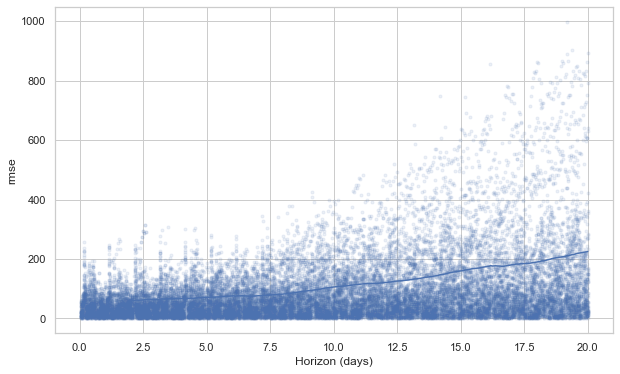

In [49]:
from prophet.plot import plot_cross_validation_metric

fig = plot_cross_validation_metric(df_cv, metric='rmse')

### Hyper Parameter Tuning

In [50]:
# Python
import itertools

param_grid = {  
    'changepoint_prior_scale': [0.001, 0.01, 0.1, 0.5],
    'seasonality_prior_scale': [0.01, 0.1, 1.0, 10.0], 
    'holidays_prior_scale': [0.01, 0.1, 1.0, 10.0]}

In [51]:
# Generate all combinations of parameters
all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]

In [52]:
dictest = all_params[1]

In [53]:
dictest.values()

dict_values([0.001, 0.01, 0.1])

In [54]:
from prophet.diagnostics import cross_validation

# Use cross validation to evaluate all parameters
# By default, the initial training period is set to three times the horizon, and cutoffs are made every half a horizon.

rmses = []  # Store the RMSEs for each parameters here
d = {}
for params in all_params:
    liskeys = list(params.values())
    key = (liskeys[0],liskeys[1], liskeys[2])
    m = Prophet(**params, yearly_seasonality=True).fit(data)  # Fit model with given parameters
    data_cv = cross_validation(m, horizon = '30 days', parallel="processes")
    data_p = performance_metrics(data_cv, rolling_window=1)
    rmses.append(data_p['rmse'].values[0])
    d[key] = data_p['rmse'].values[0]

INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff711a321c0>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36573.3   7.83803e-06       4749.42      0.7365      0.7365      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     123       36573.4   7.89388e-09       4860.29      0.2448      0.2448      160   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35317.1   4.10633e-05       5425.81    0.002845           1      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      85       33432.1   0.000656502        5227.5   1.451e-07       0.001      150  LS failed, Hessian reset 
      99         33435   3.92981e-06       4162.22      0.2789      0.2789      169   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       34398.7   0.000182056       4927.04   3.533e-08       0.001      165  LS failed, Hessian reset 
      99       34399.

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       35324.4   3.91545e-06       4960.62      0.5753      0.5753      255   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     165       33439.3   0.000384803       5488.55   7.185e-08       0.001      300  LS failed, Hessian reset 
     199       33441.3    3.4828e-07        5294.9      0.6332      0.6332      342   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     219       35324.4   1.45501e-06       4363.18   2.651e-10       0.001      317  LS failed, Hessian reset 
     232       35324.4    2.5148e-08       3864.58      0.4275           1      334   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     228       33441.6   3.43386e-05       4805.68   6.353e-09       0.001      417  LS failed, Hessian reset 
     266       33441.7    3.0618e-08       4485.99      0.2172           1      466   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff71923ae50>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36573.3   7.83803e-06       4749.42      0.7365      0.7365      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     123       36573.4   7.89388e-09       4860.29      0.2448      0.2448      160   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      85       33432.1   0.000656502        5227.5   1.451e-07       0.001      150  LS failed, Hessian reset 
      99       35317.1   4.10633e-05       5425.81    0.002845           1      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         33435   3.92981e-06       4162.22      0.2789      0.2789      169   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       34398.7   0.000182056       4927.04   3.533e-08       0.001      165  LS failed, Hessian reset 
      99       34399.

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       35324.4   3.91545e-06       4960.62      0.5753      0.5753      255   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     165       33439.3   0.000384803       5488.55   7.185e-08       0.001      300  LS failed, Hessian reset 
     199       33441.3    3.4828e-07        5294.9      0.6332      0.6332      342   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     219       35324.4   1.45501e-06       4363.18   2.651e-10       0.001      317  LS failed, Hessian reset 
     232       35324.4    2.5148e-08       3864.58      0.4275           1      334   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     228       33441.6   3.43386e-05       4805.68   6.353e-09       0.001      417  LS failed, Hessian reset 
     266       33441.7    3.0618e-08       4485.99      0.2172           1      466   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff729bdddf0>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36573.3   7.83803e-06       4749.42      0.7365      0.7365      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     123       36573.4   7.89388e-09       4860.29      0.2448      0.2448      160   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      85       33432.1   0.000656502        5227.5   1.451e-07       0.001      150  LS failed, Hessian reset 
      99       35317.1   4.10633e-05       5425.81    0.002845           1      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         33435   3.92981e-06       4162.22      0.2789      0.2789      169   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       34398.7   0.000182056       4927.04   3.533e-08       0.001      165  LS failed, Hessian reset 
      99       34399.

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       35324.4   3.91545e-06       4960.62      0.5753      0.5753      255   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     165       33439.3   0.000384803       5488.55   7.185e-08       0.001      300  LS failed, Hessian reset 
     199       33441.3    3.4828e-07        5294.9      0.6332      0.6332      342   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     219       35324.4   1.45501e-06       4363.18   2.651e-10       0.001      317  LS failed, Hessian reset 
     232       35324.4    2.5148e-08       3864.58      0.4275           1      334   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     228       33441.6   3.43386e-05       4805.68   6.353e-09       0.001      417  LS failed, Hessian reset 
     266       33441.7    3.0618e-08       4485.99      0.2172           1      466   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff71d9747f0>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36573.3   7.83803e-06       4749.42      0.7365      0.7365      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     123       36573.4   7.89388e-09       4860.29      0.2448      0.2448      160   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35317.1   4.10633e-05       5425.81    0.002845           1      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      85       33432.1   0.000656502        5227.5   1.451e-07       0.001      150  LS failed, Hessian reset 
      99         33435   3.92981e-06       4162.22      0.2789      0.2789      169   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       34398.7   0.000182056       4927.04   3.533e-08       0.001      165  LS failed, Hessian reset 
      99       34399.

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       35324.4   3.91545e-06       4960.62      0.5753      0.5753      255   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     165       33439.3   0.000384803       5488.55   7.185e-08       0.001      300  LS failed, Hessian reset 
     199       33441.3    3.4828e-07        5294.9      0.6332      0.6332      342   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     219       35324.4   1.45501e-06       4363.18   2.651e-10       0.001      317  LS failed, Hessian reset 
     232       35324.4    2.5148e-08       3864.58      0.4275           1      334   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     228       33441.6   3.43386e-05       4805.68   6.353e-09       0.001      417  LS failed, Hessian reset 
     266       33441.7    3.0618e-08       4485.99      0.2172           1      466   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff71b3ccc10>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36772.5   3.35286e-05       4894.98           1           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130         36776   0.000287565       5025.83   6.764e-08       0.001      209  LS failed, Hessian reset 
     185       36780.3   1.11441e-06       5132.11   2.155e-10       0.001      321  LS failed, Hessian reset 
     199       36780.3   1.65013e-08       4767.96      0.2674      0.2674      340   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     209       36780.3   3.46389e-08       4495.63      0.4034           1      352   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33622.3   3.02662e-07       4974.95      0.2278           1      138   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34587.9   2.26604e-05       4906.56      0.5524      0.5524      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35518.9   8.26876e-05       5080.37      0.4272      0.4272      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     122       33622.3   1.30122e-08       4602.59       0.498  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     136       35519.2   5.70472e-09        4944.8      0.2048      0.2048      181   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     119       34588.1   5.83438e-06       4796.96   1.112e-09       0.001      198  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     144       34588.2   3.01062e-08       4857.79           1           1      227   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff71c822070>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36772.5   3.35286e-05       4894.98           1           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130         36776   0.000287565       5025.83   6.764e-08       0.001      209  LS failed, Hessian reset 
     185       36780.3   1.11441e-06       5132.11   2.155e-10       0.001      321  LS failed, Hessian reset 
     199       36780.3   1.65013e-08       4767.96      0.2674      0.2674      340   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     209       36780.3   3.46389e-08       4495.63      0.4034           1      352   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33622.3   3.02662e-07       4974.95      0.2278           1      138   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34587.9   2.26604e-05       4906.56      0.5524      0.5524      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35518.9   8.26876e-05       5080.37      0.4272      0.4272      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     122       33622.3   1.30122e-08       4602.59       0.498  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     136       35519.2   5.70472e-09        4944.8      0.2048      0.2048      181   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     119       34588.1   5.83438e-06       4796.96   1.112e-09       0.001      198  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     144       34588.2   3.01062e-08       4857.79           1           1      227   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff728a31280>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36772.5   3.35286e-05       4894.98           1           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130         36776   0.000287565       5025.83   6.764e-08       0.001      209  LS failed, Hessian reset 
     185       36780.3   1.11441e-06       5132.11   2.155e-10       0.001      321  LS failed, Hessian reset 
     199       36780.3   1.65013e-08       4767.96      0.2674      0.2674      340   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     209       36780.3   3.46389e-08       4495.63      0.4034           1      352   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33622.3   3.02662e-07       4974.95      0.2278           1      138   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34587.9   2.26604e-05       4906.56      0.5524      0.5524      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35518.9   8.26876e-05       5080.37      0.4272      0.4272      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     122       33622.3   1.30122e-08       4602.59       0.498  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     136       35519.2   5.70472e-09        4944.8      0.2048      0.2048      181   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     119       34588.1   5.83438e-06       4796.96   1.112e-09       0.001      198  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     144       34588.2   3.01062e-08       4857.79           1           1      227   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff71c84bf10>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36772.5   3.35286e-05       4894.98           1           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130         36776   0.000287565       5025.83   6.764e-08       0.001      209  LS failed, Hessian reset 
     185       36780.3   1.11441e-06       5132.11   2.155e-10       0.001      321  LS failed, Hessian reset 
     199       36780.3   1.65013e-08       4767.96      0.2674      0.2674      340   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     209       36780.3   3.46389e-08       4495.63      0.4034           1      352   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33622.3   3.02662e-07       4974.95      0.2278           1      138   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34587.9   2.26604e-05       4906.56      0.5524      0.5524      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35518.9   8.26876e-05       5080.37      0.4272      0.4272      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     122       33622.3   1.30122e-08       4602.59       0.498  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     136       35519.2   5.70472e-09        4944.8      0.2048      0.2048      181   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     119       34588.1   5.83438e-06       4796.96   1.112e-09       0.001      198  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     144       34588.2   3.01062e-08       4857.79           1           1      227   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff7295da250>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         36776   0.000287245       4751.29      0.6156      0.6156      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     137       36776.9   1.20324e-08       4986.82      0.1964      0.7748      188   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33622.2   3.29906e-06       4858.51      0.8588      0.8588      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34586.7   1.17619e-05       4925.84           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35520.2   1.41708e-06       4628.47      0.7547      0.7547      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     121       33622.2   2.10016e-08       4922.55      0.4145  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     141       35520.3    1.5007e-08       5192.75      0.3144           1      184   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff71c19e160>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         36776   0.000287245       4751.29      0.6156      0.6156      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     137       36776.9   1.20324e-08       4986.82      0.1964      0.7748      188   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33622.2   3.29906e-06       4858.51      0.8588      0.8588      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34586.7   1.17619e-05       4925.84           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35520.2   1.41708e-06       4628.47      0.7547      0.7547      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     121       33622.2   2.10016e-08       4922.55      0.4145  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     141       35520.3    1.5007e-08       5192.75      0.3144           1      184   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff72af936a0>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         36776   0.000287245       4751.29      0.6156      0.6156      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     137       36776.9   1.20324e-08       4986.82      0.1964      0.7748      188   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33622.2   3.29906e-06       4858.51      0.8588      0.8588      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34586.7   1.17619e-05       4925.84           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35520.2   1.41708e-06       4628.47      0.7547      0.7547      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     121       33622.2   2.10016e-08       4922.55      0.4145  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     141       35520.3    1.5007e-08       5192.75      0.3144           1      184   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff729be73d0>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         36776   0.000287245       4751.29      0.6156      0.6156      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     137       36776.9   1.20324e-08       4986.82      0.1964      0.7748      188   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33622.2   3.29906e-06       4858.51      0.8588      0.8588      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34586.7   1.17619e-05       4925.84           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35520.2   1.41708e-06       4628.47      0.7547      0.7547      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     121       33622.2   2.10016e-08       4922.55      0.4145  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     141       35520.3    1.5007e-08       5192.75      0.3144           1      184   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff71c857550>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      78       36762.9    0.00100456       4975.66   1.964e-07       0.001      151  LS failed, Hessian reset 
      99       36768.6   0.000209664       5156.78           1           1      177   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     104       36769.7   0.000180315       4988.33   3.534e-08       0.001      237  LS failed, Hessian reset 
     164       36770.9   2.18718e-08          4931       0.246           1      311   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33609.8   3.85051e-05       4885.55      0.4104      0.4104      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34584.8   8.51322e-07       4843.03      0.5222      0.5222      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35521.6   4.86707e-07       5088.15      0.3379      0.3379      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130       34584.8   2.20261e-08       4613.15      0.4921  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     111       35521.6   1.06955e-05       4957.77   2.138e-09       0.001      186  LS failed, Hessian reset 
     199       33621.4   0.000106758       5491.78           1           1      244   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     141       35521.7   2.45466e-07       5000.63   4.823e-11       0.001      267  LS failed, Hessian reset 
     204       33623.7   0.000281954        4928.4   5.875e-08       0.001      296  LS failed, Hessian reset 
     149       35521.7   3.04004e-08       4979.41       0.365           1      276   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     278         33625   2.73056e-08       5265.82      0.7402      0.7402      388   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff728a27940>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      78       36762.9    0.00100456       4975.66   1.964e-07       0.001      151  LS failed, Hessian reset 
      99       36768.6   0.000209664       5156.78           1           1      177   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     104       36769.7   0.000180315       4988.33   3.534e-08       0.001      237  LS failed, Hessian reset 
     164       36770.9   2.18718e-08          4931       0.246           1      311   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33609.8   3.85051e-05       4885.55      0.4104      0.4104      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34584.8   8.51322e-07       4843.03      0.5222      0.5222      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35521.6   4.86707e-07       5088.15      0.3379      0.3379      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130       34584.8   2.20261e-08       4613.15      0.4921  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     111       35521.6   1.06955e-05       4957.77   2.138e-09       0.001      186  LS failed, Hessian reset 
     199       33621.4   0.000106758       5491.78           1           1      244   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     204       33623.7   0.000281954        4928.4   5.875e-08       0.001      296  LS failed, Hessian reset 
     141       35521.7   2.45466e-07       5000.63   4.823e-11       0.001      267  LS failed, Hessian reset 
     149       35521.7   3.04004e-08       4979.41       0.365           1      276   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     278         33625   2.73056e-08       5265.82      0.7402      0.7402      388   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff708bd9f10>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      78       36762.9    0.00100456       4975.66   1.964e-07       0.001      151  LS failed, Hessian reset 
      99       36768.6   0.000209664       5156.78           1           1      177   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     104       36769.7   0.000180315       4988.33   3.534e-08       0.001      237  LS failed, Hessian reset 
     164       36770.9   2.18718e-08          4931       0.246           1      311   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33609.8   3.85051e-05       4885.55      0.4104      0.4104      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34584.8   8.51322e-07       4843.03      0.5222      0.5222      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35521.6   4.86707e-07       5088.15      0.3379      0.3379      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130       34584.8   2.20261e-08       4613.15      0.4921  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     111       35521.6   1.06955e-05       4957.77   2.138e-09       0.001      186  LS failed, Hessian reset 
     199       33621.4   0.000106758       5491.78           1           1      244   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     141       35521.7   2.45466e-07       5000.63   4.823e-11       0.001      267  LS failed, Hessian reset 
     204       33623.7   0.000281954        4928.4   5.875e-08       0.001      296  LS failed, Hessian reset 
     149       35521.7   3.04004e-08       4979.41       0.365           1      276   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     278         33625   2.73056e-08       5265.82      0.7402      0.7402      388   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff71c1b3550>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      78       36762.9    0.00100456       4975.66   1.964e-07       0.001      151  LS failed, Hessian reset 
      99       36768.6   0.000209664       5156.78           1           1      177   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     104       36769.7   0.000180315       4988.33   3.534e-08       0.001      237  LS failed, Hessian reset 
     164       36770.9   2.18718e-08          4931       0.246           1      311   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33609.8   3.85051e-05       4885.55      0.4104      0.4104      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34584.8   8.51322e-07       4843.03      0.5222      0.5222      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35521.6   4.86707e-07       5088.15      0.3379      0.3379      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130       34584.8   2.20261e-08       4613.15      0.4921  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       33621.4   0.000106758       5491.78           1           1      244   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     141       35521.7   2.45466e-07       5000.63   4.823e-11       0.001      267  LS failed, Hessian reset 
     204       33623.7   0.000281954        4928.4   5.875e-08       0.001      296  LS failed, Hessian reset 
     149       35521.7   3.04004e-08       4979.41       0.365           1      276   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     278         33625   2.73056e-08       5265.82      0.7402      0.7402      388   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff71b491d30>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         36606     0.0016423       393.942      0.3552           1      148   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     174       36620.6   0.000825874        881.33   1.473e-06       0.001      271  LS failed, Hessian reset 
     199       36621.1   0.000117279       284.692           1           1      312   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     231       36621.2   1.12122e-06        206.02      0.1116      0.4856      361   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33440.2    0.00730938        1540.3           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34392.2    0.00115749       442.381           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35317.8    0.00335961       805.953           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     149       33444.7    0.00150226       905.222    3.27e-06  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       35325.9   2.59877e-05        475.94           1           1      250   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199         33446   0.000587874       502.024      0.6764      0.6764      298   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     225       35325.9   2.70862e-07       351.077      0.2777      0.8969      282   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     248       33446.1    3.2704e-07       476.469           1           1      361   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff71f1bc580>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         36606     0.0016423       393.942      0.3552           1      148   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     174       36620.6   0.000825874        881.33   1.473e-06       0.001      271  LS failed, Hessian reset 
     199       36621.1   0.000117279       284.692           1           1      312   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     231       36621.2   1.12122e-06        206.02      0.1116      0.4856      361   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33440.2    0.00730938        1540.3           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34392.2    0.00115749       442.381           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35317.8    0.00335961       805.953           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     149       33444.7    0.00150226       905.222    3.27e-06  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       35325.9   2.59877e-05        475.94           1           1      250   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199         33446   0.000587874       502.024      0.6764      0.6764      298   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     225       35325.9   2.70862e-07       351.077      0.2777      0.8969      282   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     248       33446.1    3.2704e-07       476.469           1           1      361   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff71d9747f0>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         36606     0.0016423       393.942      0.3552           1      148   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     174       36620.6   0.000825874        881.33   1.473e-06       0.001      271  LS failed, Hessian reset 
     199       36621.1   0.000117279       284.692           1           1      312   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     231       36621.2   1.12122e-06        206.02      0.1116      0.4856      361   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34392.2    0.00115749       442.381           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33440.2    0.00730938        1540.3           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35317.8    0.00335961       805.953           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     149       33444.7    0.00150226       905.222    3.27e-06  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       35325.9   2.59877e-05        475.94           1           1      250   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199         33446   0.000587874       502.024      0.6764      0.6764      298   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     225       35325.9   2.70862e-07       351.077      0.2777      0.8969      282   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     248       33446.1    3.2704e-07       476.469           1           1      361   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff71c19e160>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         36606     0.0016423       393.942      0.3552           1      148   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     174       36620.6   0.000825874        881.33   1.473e-06       0.001      271  LS failed, Hessian reset 
     199       36621.1   0.000117279       284.692           1           1      312   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     231       36621.2   1.12122e-06        206.02      0.1116      0.4856      361   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34392.2    0.00115749       442.381           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33440.2    0.00730938        1540.3           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35317.8    0.00335961       805.953           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     190       34400.5   1.19829e-07       489.672      0.3014  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       35325.9   2.59877e-05        475.94           1           1      250   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     225       35325.9   2.70862e-07       351.077      0.2777      0.8969      282   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     199         33446   0.000587874       502.024      0.6764      0.6764      298   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     248       33446.1    3.2704e-07       476.469           1           1      361   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff71b4135b0>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36806.5     0.0154462       1492.72       2.828       0.737      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       36822.6   1.31254e-05       152.612   6.326e-08       0.001      306  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     204       36822.6   3.79551e-06       235.756   1.958e-08       0.001      358  LS failed, Hessian reset 
     209       36822.6   1.01461e-07       191.173     0.03717      0.7494      368   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33620.3    0.00519642       1049.16           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34576.6    0.00387868       626.134           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35512.7    0.00120849       462.023      0.2707           1      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     149       33626.3   0.000270044       934.162   3.529e-07  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     247         35520   0.000200603       608.853   3.254e-07       0.001      373  LS failed, Hessian reset 
     263       33627.6   0.000490706       891.946   8.373e-07       0.001      428  LS failed, Hessian reset 
     299         33628   5.19882e-06       486.471      0.3443      0.3443      470   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       35520.3   1.72482e-05       546.102      0.4387           1      445   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     321         33628   8.60076e-06        431.58   1.953e-08       0.001      550  LS failed, Hessian reset 
     358       35520.4    1.9512e-07        399.46       0.546       0.546      522   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     348       33628.1   3.12636e-07       507.904           1           1      586   
Optimization terminated norma

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36806.5     0.0154462       1492.72       2.828       0.737      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       36822.6   1.31254e-05       152.612   6.326e-08       0.001      306  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     204       36822.6   3.79551e-06       235.756   1.958e-08       0.001      358  LS failed, Hessian reset 
     209       36822.6   1.01461e-07       191.173     0.03717      0.7494      368   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33620.3    0.00519642       1049.16           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34576.6    0.00387868       626.134           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35512.7    0.00120849       462.023      0.2707           1      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     149       33626.3   0.000270044       934.162   3.529e-07  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     247         35520   0.000200603       608.853   3.254e-07       0.001      373  LS failed, Hessian reset 
     263       33627.6   0.000490706       891.946   8.373e-07       0.001      428  LS failed, Hessian reset 
     299         33628   5.19882e-06       486.471      0.3443      0.3443      470   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       35520.3   1.72482e-05       546.102      0.4387           1      445   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     321         33628   8.60076e-06        431.58   1.953e-08       0.001      550  LS failed, Hessian reset 
     358       35520.4    1.9512e-07        399.46       0.546       0.546      522   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     348       33628.1   3.12636e-07       507.904           1           1      586   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff71d9747f0>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36806.5     0.0154462       1492.72       2.828       0.737      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       36822.6   1.31254e-05       152.612   6.326e-08       0.001      306  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     204       36822.6   3.79551e-06       235.756   1.958e-08       0.001      358  LS failed, Hessian reset 
     209       36822.6   1.01461e-07       191.173     0.03717      0.7494      368   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33620.3    0.00519642       1049.16           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34576.6    0.00387868       626.134           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35512.7    0.00120849       462.023      0.2707           1      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     149       33626.3   0.000270044       934.162   3.529e-07  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     247         35520   0.000200603       608.853   3.254e-07       0.001      373  LS failed, Hessian reset 
     263       33627.6   0.000490706       891.946   8.373e-07       0.001      428  LS failed, Hessian reset 
     299         33628   5.19882e-06       486.471      0.3443      0.3443      470   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       35520.3   1.72482e-05       546.102      0.4387           1      445   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     321         33628   8.60076e-06        431.58   1.953e-08       0.001      550  LS failed, Hessian reset 
     358       35520.4    1.9512e-07        399.46       0.546       0.546      522   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     348       33628.1   3.12636e-07       507.904           1           1      586   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff72b3af880>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36806.5     0.0154462       1492.72       2.828       0.737      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       36822.6   1.31254e-05       152.612   6.326e-08       0.001      306  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     204       36822.6   3.79551e-06       235.756   1.958e-08       0.001      358  LS failed, Hessian reset 
     209       36822.6   1.01461e-07       191.173     0.03717      0.7494      368   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33620.3    0.00519642       1049.16           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34576.6    0.00387868       626.134           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35512.7    0.00120849       462.023      0.2707           1      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     149       33626.3   0.000270044       934.162   3.529e-07  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     247         35520   0.000200603       608.853   3.254e-07       0.001      373  LS failed, Hessian reset 
     263       33627.6   0.000490706       891.946   8.373e-07       0.001      428  LS failed, Hessian reset 
     299         33628   5.19882e-06       486.471      0.3443      0.3443      470   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       35520.3   1.72482e-05       546.102      0.4387           1      445   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     321         33628   8.60076e-06        431.58   1.953e-08       0.001      550  LS failed, Hessian reset 
     358       35520.4    1.9512e-07        399.46       0.546       0.546      522   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     348       33628.1   3.12636e-07       507.904           1           1      586   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff728a2fb80>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36811.3    0.00255201       761.835       2.202      0.2202      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     156       36824.6   0.000420774       712.151   1.071e-06       0.001      252  LS failed, Hessian reset 
     164       36824.8   0.000178207       388.118   9.821e-07       0.001      300  LS failed, Hessian reset 
     176       36824.8   7.49714e-07       184.672      0.5677      0.5677      327   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33622.2    0.00379407       852.689           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34583.2    0.00281342       576.142           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35517.4    0.00754838         572.6      0.3773           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     139       34588.5    0.00142363       860.079   1.981e-06  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     182       35522.2   7.44264e-05       478.249   1.243e-07       0.001      265  LS failed, Hessian reset 
     199       34590.2   2.68587e-06       437.624      0.4593      0.4593      284   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       35522.2   6.89648e-05       526.818           1           1      283   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     218       34590.3   6.12971e-05       532.851   1.094e-07       0.001      343  LS failed, Hessian reset 
     237       35522.3   2.17415e-05       482.178   4.367e-08       0.001      365  LS failed, Hessian reset 
     255       34590.3   4.71651e-07       349.789      0.6768      0.6768      386   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     247       35522.3   4.24234e-07       389.346       0.302           1      379   
Optimization terminated norma

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36811.3    0.00255201       761.835       2.202      0.2202      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     156       36824.6   0.000420774       712.151   1.071e-06       0.001      252  LS failed, Hessian reset 
     164       36824.8   0.000178207       388.118   9.821e-07       0.001      300  LS failed, Hessian reset 
     176       36824.8   7.49714e-07       184.672      0.5677      0.5677      327   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34583.2    0.00281342       576.142           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33622.2    0.00379407       852.689           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35517.4    0.00754838         572.6      0.3773           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     139       34588.5    0.00142363       860.079   1.981e-06  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     182       35522.2   7.44264e-05       478.249   1.243e-07       0.001      265  LS failed, Hessian reset 
     199       34590.2   2.68587e-06       437.624      0.4593      0.4593      284   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       35522.2   6.89648e-05       526.818           1           1      283   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     218       34590.3   6.12971e-05       532.851   1.094e-07       0.001      343  LS failed, Hessian reset 
     237       35522.3   2.17415e-05       482.178   4.367e-08       0.001      365  LS failed, Hessian reset 
     255       34590.3   4.71651e-07       349.789      0.6768      0.6768      386   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     247       35522.3   4.24234e-07       389.346       0.302           1      379   
Optimization terminated norma

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36811.3    0.00255201       761.835       2.202      0.2202      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     156       36824.6   0.000420774       712.151   1.071e-06       0.001      252  LS failed, Hessian reset 
     164       36824.8   0.000178207       388.118   9.821e-07       0.001      300  LS failed, Hessian reset 
     176       36824.8   7.49714e-07       184.672      0.5677      0.5677      327   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33622.2    0.00379407       852.689           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34583.2    0.00281342       576.142           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35517.4    0.00754838         572.6      0.3773           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     139       34588.5    0.00142363       860.079   1.981e-06  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     182       35522.2   7.44264e-05       478.249   1.243e-07       0.001      265  LS failed, Hessian reset 
     199       34590.2   2.68587e-06       437.624      0.4593      0.4593      284   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       35522.2   6.89648e-05       526.818           1           1      283   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     218       34590.3   6.12971e-05       532.851   1.094e-07       0.001      343  LS failed, Hessian reset 
     237       35522.3   2.17415e-05       482.178   4.367e-08       0.001      365  LS failed, Hessian reset 
     255       34590.3   4.71651e-07       349.789      0.6768      0.6768      386   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     247       35522.3   4.24234e-07       389.346       0.302           1      379   
Optimization terminated norma

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36811.3    0.00255201       761.835       2.202      0.2202      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     156       36824.6   0.000420774       712.151   1.071e-06       0.001      252  LS failed, Hessian reset 
     164       36824.8   0.000178207       388.118   9.821e-07       0.001      300  LS failed, Hessian reset 
     176       36824.8   7.49714e-07       184.672      0.5677      0.5677      327   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33622.2    0.00379407       852.689           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34583.2    0.00281342       576.142           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35517.4    0.00754838         572.6      0.3773           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     139       34588.5    0.00142363       860.079   1.981e-06  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     182       35522.2   7.44264e-05       478.249   1.243e-07       0.001      265  LS failed, Hessian reset 
     199       34590.2   2.68587e-06       437.624      0.4593      0.4593      284   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       35522.2   6.89648e-05       526.818           1           1      283   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     218       34590.3   6.12971e-05       532.851   1.094e-07       0.001      343  LS failed, Hessian reset 
     237       35522.3   2.17415e-05       482.178   4.367e-08       0.001      365  LS failed, Hessian reset 
     255       34590.3   4.71651e-07       349.789      0.6768      0.6768      386   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     247       35522.3   4.24234e-07       389.346       0.302           1      379   
Optimization terminated norma

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36805.2    0.00139147       916.951       0.471       0.471      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     156         36820   0.000351757       1073.06   2.784e-07       0.001      228  LS failed, Hessian reset 
     199       36824.1   0.000364939       292.718           1           1      280   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     209       36824.6   0.000131078        358.85   2.262e-07       0.001      342  LS failed, Hessian reset 
     226       36824.8   3.03601e-05       257.422   1.516e-07       0.001      406  LS failed, Hessian reset 
     238       36824.8   6.08646e-07       169.879    3.15e-09       0.001      460  LS failed, Hessian reset 
     239       36824.8   1.85546e-07       217.905      0.1846   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33620.9     0.0012522       432.354           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34580.9    0.00267667       604.481           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35517.7    0.00608666       787.512           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     126       35520.6   0.000385186       1010.24   6.203e-07  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       34590.2   7.30111e-06       366.073           1           1      296   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       35521.9   6.03078e-07       516.743      0.4068      0.4068      289   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     226       34590.2   7.32692e-05       546.398   1.372e-07       0.001      365  LS failed, Hessian reset 
     250       34590.3   4.12455e-07        483.91           1           1      396   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     244         35522   1.29198e-05       341.399   7.329e-08       0.001      399  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       35522.1   5.25473e-06        493.26      0.2163      0.2163      462   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     317       35522.1   2.83732e-07       408.036       1.104      0.1104      488   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff71b426be0>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36805.2    0.00139147       916.951       0.471       0.471      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     156         36820   0.000351757       1073.06   2.784e-07       0.001      228  LS failed, Hessian reset 
     199       36824.1   0.000364939       292.718           1           1      280   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     209       36824.6   0.000131078        358.85   2.262e-07       0.001      342  LS failed, Hessian reset 
     226       36824.8   3.03601e-05       257.422   1.516e-07       0.001      406  LS failed, Hessian reset 
     238       36824.8   6.08646e-07       169.879    3.15e-09       0.001      460  LS failed, Hessian reset 
     239       36824.8   1.85546e-07       217.905      0.1846   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33620.9     0.0012522       432.354           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34580.9    0.00267667       604.481           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35517.7    0.00608666       787.512           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     126       35520.6   0.000385186       1010.24   6.203e-07  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       34590.2   7.30111e-06       366.073           1           1      296   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       35521.9   6.03078e-07       516.743      0.4068      0.4068      289   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     226       34590.2   7.32692e-05       546.398   1.372e-07       0.001      365  LS failed, Hessian reset 
     250       34590.3   4.12455e-07        483.91           1           1      396   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     244         35522   1.29198e-05       341.399   7.329e-08       0.001      399  LS failed, Hessian reset 
     299       35522.1   5.25473e-06        493.26      0.2163      0.2163      462   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     317       35522.1   2.83732e-07       408.036       1.104      0.1104      488   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff71c821f10>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36805.2    0.00139147       916.951       0.471       0.471      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     156         36820   0.000351757       1073.06   2.784e-07       0.001      228  LS failed, Hessian reset 
     199       36824.1   0.000364939       292.718           1           1      280   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     209       36824.6   0.000131078        358.85   2.262e-07       0.001      342  LS failed, Hessian reset 
     226       36824.8   3.03601e-05       257.422   1.516e-07       0.001      406  LS failed, Hessian reset 
     238       36824.8   6.08646e-07       169.879    3.15e-09       0.001      460  LS failed, Hessian reset 
     239       36824.8   1.85546e-07       217.905      0.1846   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33620.9     0.0012522       432.354           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34580.9    0.00267667       604.481           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35517.7    0.00608666       787.512           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     126       35520.6   0.000385186       1010.24   6.203e-07  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       35521.9   6.03078e-07       516.743      0.4068      0.4068      289   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       34590.2   7.30111e-06       366.073           1           1      296   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     226       34590.2   7.32692e-05       546.398   1.372e-07       0.001      365  LS failed, Hessian reset 
     250       34590.3   4.12455e-07        483.91           1           1      396   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     244         35522   1.29198e-05       341.399   7.329e-08       0.001      399  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       35522.1   5.25473e-06        493.26      0.2163      0.2163      462   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     317       35522.1   2.83732e-07       408.036       1.104      0.1104      488   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff72ae98160>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36805.2    0.00139147       916.951       0.471       0.471      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     156         36820   0.000351757       1073.06   2.784e-07       0.001      228  LS failed, Hessian reset 
     199       36824.1   0.000364939       292.718           1           1      280   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     209       36824.6   0.000131078        358.85   2.262e-07       0.001      342  LS failed, Hessian reset 
     226       36824.8   3.03601e-05       257.422   1.516e-07       0.001      406  LS failed, Hessian reset 
     238       36824.8   6.08646e-07       169.879    3.15e-09       0.001      460  LS failed, Hessian reset 
     239       36824.8   1.85546e-07       217.905      0.1846   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -586.803
Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34580.9    0.00267667       604.481           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33620.9     0.0012522       432.354           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35517.7    0.00608666       787.512           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     126       35520.6   0.000385186       1010.24   6.203e-07  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       34590.2   7.30111e-06       366.073           1           1      296   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       35521.9   6.03078e-07       516.743      0.4068      0.4068      289   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     226       34590.2   7.32692e-05       546.398   1.372e-07       0.001      365  LS failed, Hessian reset 
     250       34590.3   4.12455e-07        483.91           1           1      396   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     244         35522   1.29198e-05       341.399   7.329e-08       0.001      399  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       35522.1   5.25473e-06        493.26      0.2163      0.2163      462   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     317       35522.1   2.83732e-07       408.036       1.104      0.1104      488   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff72ae98160>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         36690    0.00315894        347.81           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       36699.7     0.0213953       497.334           1           1      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       36704.5   0.000653347       353.418           1           1      346   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       36707.1   0.000149107       123.859       0.908       0.908      466   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         36709     0.0022002       90.2459      0.1385           1      583   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34400.4    0.00014729        116.86      0.6994      0.6994      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35329.1    0.00058767       73.8232           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      79       33447.6   3.44737e-05       96.0347   1.801e-07       0.001      162  LS failed, Hessian reset 
      99       33447.7   9.92833e-05       44.8855       0.799       0.799      184   
    Iter      log prob        ||dx||      ||g

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       35329.9   9.68656e-05       48.4877      0.9537      0.9537      583   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33448.7    0.00203487       86.3271      0.4547           1      679   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     436       33448.8   2.92756e-05       90.9911   2.294e-07       0.001      769  LS failed, Hessian reset 
     499         35330    0.00152523       74.2131           1           1      701   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     503         35330   3.35234e-05       102.322   4.134e-07       0.001      757  LS failed, Hessian reset 
     490       33448.9   1.74158e-06       35.1994      0.3387      0.9081      836   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     558       35330.1   4.21276e-06       38.2894       0.769       0.769      829   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff71b4130d0>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         36690    0.00315894        347.81           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       36699.7     0.0213953       497.334           1           1      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       36704.5   0.000653347       353.418           1           1      346   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       36707.1   0.000149107       123.859       0.908       0.908      466   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         36709     0.0022002       90.2459      0.1385           1      583   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34400.4    0.00014729        116.86      0.6994      0.6994      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35329.1    0.00058767       73.8232           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      79       33447.6   3.44737e-05       96.0347   1.801e-07       0.001      162  LS failed, Hessian reset 
      99       33447.7   9.92833e-05       44.8855       0.799       0.799      184   
    Iter      log prob        ||dx||      ||g

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       35329.9   9.68656e-05       48.4877      0.9537      0.9537      583   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33448.7    0.00203487       86.3271      0.4547           1      679   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         35330    0.00152523       74.2131           1           1      701   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     436       33448.8   2.92756e-05       90.9911   2.294e-07       0.001      769  LS failed, Hessian reset 
     503         35330   3.35234e-05       102.322   4.134e-07       0.001      757  LS failed, Hessian reset 
     490       33448.9   1.74158e-06       35.1994      0.3387      0.9081      836   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     558       35330.1   4.21276e-06       38.2894       0.769       0.769      829   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff729be7fd0>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         36690    0.00315894        347.81           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       36699.7     0.0213953       497.334           1           1      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       36704.5   0.000653347       353.418           1           1      346   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       36707.1   0.000149107       123.859       0.908       0.908      466   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         36709     0.0022002       90.2459      0.1385           1      583   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34400.4    0.00014729        116.86      0.6994      0.6994      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35329.1    0.00058767       73.8232           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      79       33447.6   3.44737e-05       96.0347   1.801e-07       0.001      162  LS failed, Hessian reset 
      99       33447.7   9.92833e-05       44.8855       0.799       0.799      184   
    Iter      log prob        ||dx||      ||g

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       35329.9   9.68656e-05       48.4877      0.9537      0.9537      583   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33448.7    0.00203487       86.3271      0.4547           1      679   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     436       33448.8   2.92756e-05       90.9911   2.294e-07       0.001      769  LS failed, Hessian reset 
     499         35330    0.00152523       74.2131           1           1      701   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     503         35330   3.35234e-05       102.322   4.134e-07       0.001      757  LS failed, Hessian reset 
     490       33448.9   1.74158e-06       35.1994      0.3387      0.9081      836   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     558       35330.1   4.21276e-06       38.2894       0.769       0.769      829   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff71c822070>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         36690    0.00315894        347.81           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       36699.7     0.0213953       497.334           1           1      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       36704.5   0.000653347       353.418           1           1      346   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       36707.1   0.000149107       123.859       0.908       0.908      466   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         36709     0.0022002       90.2459      0.1385           1      583   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34400.4    0.00014729        116.86      0.6994      0.6994      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35329.1    0.00058767       73.8232           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      79       33447.6   3.44737e-05       96.0347   1.801e-07       0.001      162  LS failed, Hessian reset 
      99       33447.7   9.92833e-05       44.8855       0.799       0.799      184   
    Iter      log prob        ||dx||      ||g

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       35329.9   9.68656e-05       48.4877      0.9537      0.9537      583   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33448.7    0.00203487       86.3271      0.4547           1      679   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     436       33448.8   2.92756e-05       90.9911   2.294e-07       0.001      769  LS failed, Hessian reset 
     499         35330    0.00152523       74.2131           1           1      701   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     490       33448.9   1.74158e-06       35.1994      0.3387      0.9081      836   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     503         35330   3.35234e-05       102.322   4.134e-07       0.001      757  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     558       35330.1   4.21276e-06       38.2894       0.769       0.769      829   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff7295b3400>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36902.8     0.0260906       336.315           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     173       36923.2   4.15534e-05       95.2417   1.753e-07       0.001      273  LS failed, Hessian reset 
     199       36924.1    0.00131826       188.375           1           1      303   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       36928.1   0.000101647       139.488      0.4576      0.4576      441   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     351       36929.1   4.89736e-05        82.734   7.201e-07       0.001      557  LS failed, Hessian reset 
     399       36929.4   9.35956e-05       130.215      0.1865      0.1865      619   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33630.4    0.00137912       162.316           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34587.6   0.000928374       74.8665           1           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35522.9    0.00081663       70.5524           1           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115       33630.9   3.75112e-05       91.1197   4.914e-07  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     469       33634.3   2.53218e-05       88.4723   2.848e-07       0.001      703  LS failed, Hessian reset 
     399       35523.8    0.00173465       90.5967           1           1      649   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33634.3   5.83433e-05       83.4044      0.4212           1      738   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     401       35523.8   5.92235e-05       68.4395   1.101e-06       0.001      700  LS failed, Hessian reset 
     599       33637.7    0.00292488       307.259           1           1      850   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     456       35523.8   1.47893e-05       50.4777   2.276e-07       0.001      805  LS failed, Hessian reset 
     473       35523.8   4.46054e-06       35.9295           1           1      827   
Optimization terminated normally: 
  Conver

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       33638.6   0.000161142       52.3937           1           1      971   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     756       33638.6   2.02026e-05       75.2907   3.984e-07       0.001     1087  LS failed, Hessian reset 
     771       33638.7   1.48751e-06       38.6199      0.3361           1     1106   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff71c838f10>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36902.8     0.0260906       336.315           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     173       36923.2   4.15534e-05       95.2417   1.753e-07       0.001      273  LS failed, Hessian reset 
     199       36924.1    0.00131826       188.375           1           1      303   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       36928.1   0.000101647       139.488      0.4576      0.4576      441   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     351       36929.1   4.89736e-05        82.734   7.201e-07       0.001      557  LS failed, Hessian reset 
     399       36929.4   9.35956e-05       130.215      0.1865      0.1865      619   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33630.4    0.00137912       162.316           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34587.6   0.000928374       74.8665           1           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35522.9    0.00081663       70.5524           1           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115       33630.9   3.75112e-05       91.1197   4.914e-07  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       35523.8    0.00173465       90.5967           1           1      649   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33634.3   5.83433e-05       83.4044      0.4212           1      738   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     401       35523.8   5.92235e-05       68.4395   1.101e-06       0.001      700  LS failed, Hessian reset 
     599       33637.7    0.00292488       307.259           1           1      850   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     456       35523.8   1.47893e-05       50.4777   2.276e-07       0.001      805  LS failed, Hessian reset 
     473       35523.8   4.46054e-06       35.9295           1           1      827   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       33638.6   0.000161142       52.3937           1           1      971   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     756       33638.6   2.02026e-05       75.2907   3.984e-07       0.001     1087  LS failed, Hessian reset 
     771       33638.7   1.48751e-06       38.6199      0.3361           1     1106   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff71f1bc580>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36902.8     0.0260906       336.315           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     173       36923.2   4.15534e-05       95.2417   1.753e-07       0.001      273  LS failed, Hessian reset 
     199       36924.1    0.00131826       188.375           1           1      303   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       36928.1   0.000101647       139.488      0.4576      0.4576      441   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     351       36929.1   4.89736e-05        82.734   7.201e-07       0.001      557  LS failed, Hessian reset 
     399       36929.4   9.35956e-05       130.215      0.1865      0.1865      619   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33630.4    0.00137912       162.316           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34587.6   0.000928374       74.8665           1           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35522.9    0.00081663       70.5524           1           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115       33630.9   3.75112e-05       91.1197   4.914e-07  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     469       33634.3   2.53218e-05       88.4723   2.848e-07       0.001      703  LS failed, Hessian reset 
     399       35523.8    0.00173465       90.5967           1           1      649   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33634.3   5.83433e-05       83.4044      0.4212           1      738   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     401       35523.8   5.92235e-05       68.4395   1.101e-06       0.001      700  LS failed, Hessian reset 
     599       33637.7    0.00292488       307.259           1           1      850   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     456       35523.8   1.47893e-05       50.4777   2.276e-07       0.001      805  LS failed, Hessian reset 
     473       35523.8   4.46054e-06       35.9295           1           1      827   
Optimization terminated normally: 
  Conver

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       33638.6   0.000161142       52.3937           1           1      971   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     756       33638.6   2.02026e-05       75.2907   3.984e-07       0.001     1087  LS failed, Hessian reset 
     771       33638.7   1.48751e-06       38.6199      0.3361           1     1106   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff71b42fdf0>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36902.8     0.0260906       336.315           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     173       36923.2   4.15534e-05       95.2417   1.753e-07       0.001      273  LS failed, Hessian reset 
     199       36924.1    0.00131826       188.375           1           1      303   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       36928.1   0.000101647       139.488      0.4576      0.4576      441   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     351       36929.1   4.89736e-05        82.734   7.201e-07       0.001      557  LS failed, Hessian reset 
     399       36929.4   9.35956e-05       130.215      0.1865      0.1865      619   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33630.4    0.00137912       162.316           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34587.6   0.000928374       74.8665           1           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35522.9    0.00081663       70.5524           1           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115       33630.9   3.75112e-05       91.1197   4.914e-07  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       35523.8    0.00173465       90.5967           1           1      649   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     469       33634.3   2.53218e-05       88.4723   2.848e-07       0.001      703  LS failed, Hessian reset 
     499       33634.3   5.83433e-05       83.4044      0.4212           1      738   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     401       35523.8   5.92235e-05       68.4395   1.101e-06       0.001      700  LS failed, Hessian reset 
     599       33637.7    0.00292488       307.259           1           1      850   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     456       35523.8   1.47893e-05       50.4777   2.276e-07       0.001      805  LS failed, Hessian reset 
     473       35523.8   4.46054e-06       35.9295           1           1      827   
Optimization terminated normally: 
  Conver

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       33638.6   0.000161142       52.3937           1           1      971   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     756       33638.6   2.02026e-05       75.2907   3.984e-07       0.001     1087  LS failed, Hessian reset 
     771       33638.7   1.48751e-06       38.6199      0.3361           1     1106   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff71c1a4550>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36920.2     0.0347504       836.922           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       36923.6     0.0519886       286.524           1           1      231   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       36926.7    0.00119822       225.343      0.8999      0.8999      344   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       36930.1    0.00427712       423.413           1           1      460   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     447         36931   1.23328e-05       40.2841    2.87e-07       0.001      574  LS failed, Hessian reset 
     499       36931.6    0.00729592    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      35         34589    7.3455e-05       71.7026   9.137e-07       0.001      104  LS failed, Hessian reset 
      74         33632   4.75336e-05       94.4329   1.569e-07       0.001      150  LS failed, Hessian reset 
      85       35524.9   3.07201e-05       92.7313   3.389e-07       0.001      158  LS failed, Hessian reset 
      99       33632.4    0.00112653       62.1384           1           1      177   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34589.6     0.0110437       384.984           1           1      183   
  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     445       33639.1    9.8261e-05       117.126    1.58e-06       0.001      651  LS failed, Hessian reset 
     499       33640.3    0.00152011       89.4546       1.557      0.1557      718   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       33641.1   0.000556973       170.515      0.5339      0.5339      844   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     613       33641.4   3.19069e-05       90.7285   1.841e-07       0.001      919  LS failed, Hessian reset 
     699       33641.8   0.000152935       69.0839      0.4074           1     1023   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     734       33641.9   8.80127e-05       147.284   1.508e-07       0.001     1119  LS failed, Hessian reset 
     799       33642.1    0.00015616       46.3812      0.1575           1     1196   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff71c82b790>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36920.2     0.0347504       836.922           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       36923.6     0.0519886       286.524           1           1      231   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       36926.7    0.00119822       225.343      0.8999      0.8999      344   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       36930.1    0.00427712       423.413           1           1      460   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     447         36931   1.23328e-05       40.2841    2.87e-07       0.001      574  LS failed, Hessian reset 
     499       36931.6    0.00729592    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      35         34589    7.3455e-05       71.7026   9.137e-07       0.001      104  LS failed, Hessian reset 
      74         33632   4.75336e-05       94.4329   1.569e-07       0.001      150  LS failed, Hessian reset 
      99       33632.4    0.00112653       62.1384           1           1      177   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      85       35524.9   3.07201e-05       92.7313   3.389e-07       0.001      158  LS failed, Hessian reset 
      99       34589.6     0.0110437       384.984           1           1      183   
  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     445       33639.1    9.8261e-05       117.126    1.58e-06       0.001      651  LS failed, Hessian reset 
     499       33640.3    0.00152011       89.4546       1.557      0.1557      718   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       33641.1   0.000556973       170.515      0.5339      0.5339      844   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     613       33641.4   3.19069e-05       90.7285   1.841e-07       0.001      919  LS failed, Hessian reset 
     699       33641.8   0.000152935       69.0839      0.4074           1     1023   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     734       33641.9   8.80127e-05       147.284   1.508e-07       0.001     1119  LS failed, Hessian reset 
     799       33642.1    0.00015616       46.3812      0.1575           1     1196   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff71b349ca0>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36920.2     0.0347504       836.922           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       36923.6     0.0519886       286.524           1           1      231   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       36926.7    0.00119822       225.343      0.8999      0.8999      344   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       36930.1    0.00427712       423.413           1           1      460   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     447         36931   1.23328e-05       40.2841    2.87e-07       0.001      574  LS failed, Hessian reset 
     499       36931.6    0.00729592    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      35         34589    7.3455e-05       71.7026   9.137e-07       0.001      104  LS failed, Hessian reset 
      74         33632   4.75336e-05       94.4329   1.569e-07       0.001      150  LS failed, Hessian reset 
      85       35524.9   3.07201e-05       92.7313   3.389e-07       0.001      158  LS failed, Hessian reset 
      99       33632.4    0.00112653       62.1384           1           1      177   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34589.6     0.0110437       384.984           1           1      183   
  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     445       33639.1    9.8261e-05       117.126    1.58e-06       0.001      651  LS failed, Hessian reset 
     499       33640.3    0.00152011       89.4546       1.557      0.1557      718   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       33641.1   0.000556973       170.515      0.5339      0.5339      844   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     613       33641.4   3.19069e-05       90.7285   1.841e-07       0.001      919  LS failed, Hessian reset 
     699       33641.8   0.000152935       69.0839      0.4074           1     1023   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     734       33641.9   8.80127e-05       147.284   1.508e-07       0.001     1119  LS failed, Hessian reset 
     799       33642.1    0.00015616       46.3812      0.1575           1     1196   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff71b491dc0>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36920.2     0.0347504       836.922           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       36923.6     0.0519886       286.524           1           1      231   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       36926.7    0.00119822       225.343      0.8999      0.8999      344   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       36930.1    0.00427712       423.413           1           1      460   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     447         36931   1.23328e-05       40.2841    2.87e-07       0.001      574  LS failed, Hessian reset 
     499       36931.6    0.00729592    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      35         34589    7.3455e-05       71.7026   9.137e-07       0.001      104  LS failed, Hessian reset 
      74         33632   4.75336e-05       94.4329   1.569e-07       0.001      150  LS failed, Hessian reset 
      99       33632.4    0.00112653       62.1384           1           1      177   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      85       35524.9   3.07201e-05       92.7313   3.389e-07       0.001      158  LS failed, Hessian reset 
      99       34589.6     0.0110437       384.984           1           1      183   
  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     313       35525.7    7.7218e-06       42.9776           1           1      545   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     445       33639.1    9.8261e-05       117.126    1.58e-06       0.001      651  LS failed, Hessian reset 
     499       33640.3    0.00152011       89.4546       1.557      0.1557      718   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       33641.1   0.000556973       170.515      0.5339      0.5339      844   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     613       33641.4   3.19069e-05       90.7285   1.841e-07       0.001      919  LS failed, Hessian reset 
     699       33641.8   0.000152935       69.0839      0.4074           1     1023   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     734       33641.9   8.80127e-05       147.284   1.508e-07       0.001     1119  LS failed, Hessian reset 
     799       33642.1    0.00015616       46.3812      0.1575           1     1196   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff72aeae550>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36919.6    0.00554347       169.827       3.342      0.3342      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     134       36921.3   2.62609e-05       82.0298   2.662e-07       0.001      220  LS failed, Hessian reset 
     199       36925.6    0.00196616       325.892           1           1      296   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       36930.8    0.00161165       62.8107           1           1      410   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     388       36933.5   1.47025e-05       45.2255   3.244e-07       0.001      563  LS failed, Hessian reset 
     399       36933.6   0.000527837       229.378      0.6697      0.6697      576   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      35         34589   8.13551e-05       47.7358   1.159e-06       0.001      102  LS failed, Hessian reset 
      42       33630.8   6.17507e-05        174.89   2.927e-07       0.001      113  LS failed, Hessian reset 
      99         35525   0.000142599        97.432           1           1      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         33632   0.000808664       96.8542           1           1      182   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     105         3552

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     286       35525.6   0.000120265       73.6392   9.119e-07       0.001      545  LS failed, Hessian reset 
     399       33635.7   0.000344788         93.95      0.3003      0.3003      601   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       35525.7   7.95973e-05       36.8188      0.2337           1      560   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     342       35525.7    2.1019e-05       67.8683   2.741e-07       0.001      659  LS failed, Hessian reset 
     499       33639.8    0.00446538       264.426      0.2082           1      724   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     355       35525.7   4.93276e-06       26.7973      0.3296           1      675   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       33640.7   7.74884e-05       46.1859           1           1      845   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     644       33640.8   2.77354e-05       69.1632   1.699e-07       0.001      949  LS failed, Hessian reset 
     692       33640.9   1.77849e-05       56.1169   2.806e-07       0.001     1042  LS failed, Hessian reset 
     699       33640.9   1.29374e-05       32.7374      0.4975      0.4975     1049   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     735       33640.9   8.24963e-06       33.3039      0.8349      0.8349     1093   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff728a27940>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36919.6    0.00554347       169.827       3.342      0.3342      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     134       36921.3   2.62609e-05       82.0298   2.662e-07       0.001      220  LS failed, Hessian reset 
     199       36925.6    0.00196616       325.892           1           1      296   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       36930.8    0.00161165       62.8107           1           1      410   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     388       36933.5   1.47025e-05       45.2255   3.244e-07       0.001      563  LS failed, Hessian reset 
     399       36933.6   0.000527837       229.378      0.6697      0.6697      576   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      35         34589   8.13551e-05       47.7358   1.159e-06       0.001      102  LS failed, Hessian reset 
      42       33630.8   6.17507e-05        174.89   2.927e-07       0.001      113  LS failed, Hessian reset 
      99         35525   0.000142599        97.432           1           1      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         33632   0.000808664       96.8542           1           1      182   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      71       34589.

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     286       35525.6   0.000120265       73.6392   9.119e-07       0.001      545  LS failed, Hessian reset 
     299       35525.7   7.95973e-05       36.8188      0.2337           1      560   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33635.7   0.000344788         93.95      0.3003      0.3003      601   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     342       35525.7    2.1019e-05       67.8683   2.741e-07       0.001      659  LS failed, Hessian reset 
     355       35525.7   4.93276e-06       26.7973      0.3296           1      675   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       33639.8    0.00446538       264.426      0.2082           1      724   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       33640.7   7.74884e-05       46.1859           1           1      845   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     644       33640.8   2.77354e-05       69.1632   1.699e-07       0.001      949  LS failed, Hessian reset 
     692       33640.9   1.77849e-05       56.1169   2.806e-07       0.001     1042  LS failed, Hessian reset 
     699       33640.9   1.29374e-05       32.7374      0.4975      0.4975     1049   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     735       33640.9   8.24963e-06       33.3039      0.8349      0.8349     1093   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff71c1a3f10>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36919.6    0.00554347       169.827       3.342      0.3342      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     134       36921.3   2.62609e-05       82.0298   2.662e-07       0.001      220  LS failed, Hessian reset 
     199       36925.6    0.00196616       325.892           1           1      296   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       36930.8    0.00161165       62.8107           1           1      410   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     388       36933.5   1.47025e-05       45.2255   3.244e-07       0.001      563  LS failed, Hessian reset 
     399       36933.6   0.000527837       229.378      0.6697      0.6697      576   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      35         34589   8.13551e-05       47.7358   1.159e-06       0.001      102  LS failed, Hessian reset 
      42       33630.8   6.17507e-05        174.89   2.927e-07       0.001      113  LS failed, Hessian reset 
      99         35525   0.000142599        97.432           1           1      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         33632   0.000808664       96.8542           1           1      182   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      71       34589.

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     286       35525.6   0.000120265       73.6392   9.119e-07       0.001      545  LS failed, Hessian reset 
     399       33635.7   0.000344788         93.95      0.3003      0.3003      601   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       35525.7   7.95973e-05       36.8188      0.2337           1      560   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     342       35525.7    2.1019e-05       67.8683   2.741e-07       0.001      659  LS failed, Hessian reset 
     499       33639.8    0.00446538       264.426      0.2082           1      724   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     355       35525.7   4.93276e-06       26.7973      0.3296           1      675   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       33640.7   7.74884e-05       46.1859           1           1      845   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     644       33640.8   2.77354e-05       69.1632   1.699e-07       0.001      949  LS failed, Hessian reset 
     692       33640.9   1.77849e-05       56.1169   2.806e-07       0.001     1042  LS failed, Hessian reset 
     699       33640.9   1.29374e-05       32.7374      0.4975      0.4975     1049   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     735       33640.9   8.24963e-06       33.3039      0.8349      0.8349     1093   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff72aeaf9d0>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36919.6    0.00554347       169.827       3.342      0.3342      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     134       36921.3   2.62609e-05       82.0298   2.662e-07       0.001      220  LS failed, Hessian reset 
     199       36925.6    0.00196616       325.892           1           1      296   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       36930.8    0.00161165       62.8107           1           1      410   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     388       36933.5   1.47025e-05       45.2255   3.244e-07       0.001      563  LS failed, Hessian reset 
     399       36933.6   0.000527837       229.378      0.6697      0.6697      576   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      35         34589   8.13551e-05       47.7358   1.159e-06       0.001      102  LS failed, Hessian reset 
      42       33630.8   6.17507e-05        174.89   2.927e-07       0.001      113  LS failed, Hessian reset 
      99         35525   0.000142599        97.432           1           1      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         33632   0.000808664       96.8542           1           1      182   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      71       34589.

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     286       35525.6   0.000120265       73.6392   9.119e-07       0.001      545  LS failed, Hessian reset 
     399       33635.7   0.000344788         93.95      0.3003      0.3003      601   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       35525.7   7.95973e-05       36.8188      0.2337           1      560   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     342       35525.7    2.1019e-05       67.8683   2.741e-07       0.001      659  LS failed, Hessian reset 
     499       33639.8    0.00446538       264.426      0.2082           1      724   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     355       35525.7   4.93276e-06       26.7973      0.3296           1      675   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       33640.7   7.74884e-05       46.1859           1           1      845   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     644       33640.8   2.77354e-05       69.1632   1.699e-07       0.001      949  LS failed, Hessian reset 
     692       33640.9   1.77849e-05       56.1169   2.806e-07       0.001     1042  LS failed, Hessian reset 
     699       33640.9   1.29374e-05       32.7374      0.4975      0.4975     1049   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     735       33640.9   8.24963e-06       33.3039      0.8349      0.8349     1093   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff71f1bc580>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36742.3     0.0324611       262.699           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       36758.4    0.00301116       39.0654       1.109      0.1109      232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         36770    0.00237545       98.7202           1           1      344   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       36775.6   0.000947667       170.141           1           1      458   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       36778.2    0.00090469       114.396           1           1      566   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33461.2   0.000415982       170.501           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35338.8    0.00563841       258.095      0.2944      0.2944      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34404.6     0.0019035       150.927           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33469.1      0.100456       1436.55           1  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     980         33517   0.000593951       11.0546      0.9042      0.9042     1119   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     887         35377   3.32278e-05        82.884   4.465e-07       0.001     1059  LS failed, Hessian reset 
     899       35377.1   0.000132407       29.9409           1           1     1072   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       35377.7    0.00141974       69.8596           1           1     1183   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1069       35377.9   6.44558e-06        15.898   5.308e-07       0.001     1320  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff71c1b3550>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36742.3     0.0324611       262.699           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       36758.4    0.00301116       39.0654       1.109      0.1109      232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         36770    0.00237545       98.7202           1           1      344   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       36775.6   0.000947667       170.141           1           1      458   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       36778.2    0.00090469       114.396           1           1      566   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33461.2   0.000415982       170.501           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34404.6     0.0019035       150.927           1           1      124   
      99       35338.8    0.00563841       258.095      0.2944      0.2944      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       34427.3    0.00163357         169.8           1  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     887         35377   3.32278e-05        82.884   4.465e-07       0.001     1059  LS failed, Hessian reset 
     899       35377.1   0.000132407       29.9409           1           1     1072   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     980         33517   0.000593951       11.0546      0.9042      0.9042     1119   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     999       35377.7    0.00141974       69.8596           1           1     1183   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1069       35377.9   6.44558e-06        15.898   5.308e-07       0.001     1320  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff729bef2b0>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36742.3     0.0324611       262.699           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       36758.4    0.00301116       39.0654       1.109      0.1109      232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         36770    0.00237545       98.7202           1           1      344   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       36775.6   0.000947667       170.141           1           1      458   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       36778.2    0.00090469       114.396           1           1      566   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
Initial log joint probability = -586.803
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33461.2   0.000415982       170.501           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34404.6     0.0019035       150.927           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35338.8    0.00563841       258.095      0.2944      0.2944      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33469.1      0.100456       1436.55           1  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     980         33517   0.000593951       11.0546      0.9042      0.9042     1119   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     887         35377   3.32278e-05        82.884   4.465e-07       0.001     1059  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       35377.1   0.000132407       29.9409           1           1     1072   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       35377.7    0.00141974       69.8596           1           1     1183   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1069       35377.9   6.44558e-06        15.898   5.308e-07       0.001     1320  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff71b46c6d0>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36742.3     0.0324611       262.699           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       36758.4    0.00301116       39.0654       1.109      0.1109      232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         36770    0.00237545       98.7202           1           1      344   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       36775.6   0.000947667       170.141           1           1      458   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       36778.2    0.00090469       114.396           1           1      566   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33461.2   0.000415982       170.501           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35338.8    0.00563841       258.095      0.2944      0.2944      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34404.6     0.0019035       150.927           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33469.1      0.100456       1436.55           1  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     980         33517   0.000593951       11.0546      0.9042      0.9042     1119   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     887         35377   3.32278e-05        82.884   4.465e-07       0.001     1059  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       35377.1   0.000132407       29.9409           1           1     1072   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       35377.7    0.00141974       69.8596           1           1     1183   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1069       35377.9   6.44558e-06        15.898   5.308e-07       0.001     1320  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff71c1a4550>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36973.1    0.00312279       501.863           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       36992.2   0.000285068       37.7116           1           1      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         37008   0.000212585       62.9475           1           1      347   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       37011.8     0.0103067       201.155           1           1      455   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         37015      0.121976       950.179           1           1      563   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33671.4     0.0236482       917.579       0.256           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         34652      0.375446       1179.02      0.5503      0.5503      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35560.5     0.0120097       152.643           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33696.8    0.00619006       105.955           1  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       35561.6      0.031832       152.527       4.001      0.4001      238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     272       33700.9   5.79107e-06       20.0661   2.484e-07       0.001      356  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       35562.3     0.0383289       126.731           1           1      353   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     381       35567.7   0.000336352       9.05515      0.9798      0.9798      448   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff71b4135b0>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36973.1    0.00312279       501.863           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       36992.2   0.000285068       37.7116           1           1      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         37008   0.000212585       62.9475           1           1      347   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       37011.8     0.0103067       201.155           1           1      455   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         37015      0.121976       950.179           1           1      563   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33671.4     0.0236482       917.579       0.256           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         34652      0.375446       1179.02      0.5503      0.5503      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35560.5     0.0120097       152.643           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33696.8    0.00619006       105.955           1  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       35561.6      0.031832       152.527       4.001      0.4001      238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     272       33700.9   5.79107e-06       20.0661   2.484e-07       0.001      356  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       35562.3     0.0383289       126.731           1           1      353   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     381       35567.7   0.000336352       9.05515      0.9798      0.9798      448   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff71b444760>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36973.1    0.00312279       501.863           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       36992.2   0.000285068       37.7116           1           1      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         37008   0.000212585       62.9475           1           1      347   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       37011.8     0.0103067       201.155           1           1      455   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         37015      0.121976       950.179           1           1      563   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33671.4     0.0236482       917.579       0.256           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         34652      0.375446       1179.02      0.5503      0.5503      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35560.5     0.0120097       152.643           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33696.8    0.00619006       105.955           1  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       35561.6      0.031832       152.527       4.001      0.4001      238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     272       33700.9   5.79107e-06       20.0661   2.484e-07       0.001      356  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       35562.3     0.0383289       126.731           1           1      353   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     381       35567.7   0.000336352       9.05515      0.9798      0.9798      448   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff71c1b3550>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36973.1    0.00312279       501.863           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       36992.2   0.000285068       37.7116           1           1      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         37008   0.000212585       62.9475           1           1      347   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       37011.8     0.0103067       201.155           1           1      455   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         37015      0.121976       950.179           1           1      563   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33671.4     0.0236482       917.579       0.256           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         34652      0.375446       1179.02      0.5503      0.5503      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35560.5     0.0120097       152.643           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     189         34655   0.000422814       10.1992           1  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       35561.6      0.031832       152.527       4.001      0.4001      238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     272       33700.9   5.79107e-06       20.0661   2.484e-07       0.001      356  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       35562.3     0.0383289       126.731           1           1      353   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     381       35567.7   0.000336352       9.05515      0.9798      0.9798      448   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff72aea59d0>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36976.1    0.00221087       443.011      0.8274      0.8274      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       36978.4   0.000596723       77.5375           1           1      232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         36981    0.00426808       151.623      0.4222           1      347   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       36988.6     0.0180795        428.78      0.2518           1      454   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       37020.6    0.00136724       150.485           1           1      562   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33696.9     0.0403961       539.065           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34595.4     0.0079963       125.103           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35562.3     0.0517256       295.934           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33700.7    0.00168969       18.0983           1  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       35570.1   0.000882191       84.3523           1           1      341   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       33705.9   0.000580983        15.951      0.5022      0.9777      394   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33709.1     0.0685703       347.233           1           1      515   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     369       35570.7   7.20044e-06       24.0407    3.57e-07       0.001      474  LS failed, Hessian reset 
     399       35570.8    0.00127241        41.533           1           1      509   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     408       33709.6   1.44609e-05       43.1262   3.534e-07       0.001      578  LS failed, Hessian reset 
     445       35571.2   0.000141487       16.6124           1

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     451       33710.8   1.22596e-05       27.9793   1.641e-07       0.001      679  LS failed, Hessian reset 
     472       33711.4   2.67371e-05       68.8679    4.55e-07       0.001      746  LS failed, Hessian reset 
     499       33711.8     0.0043543       53.0281      0.1637      0.7639      778   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     592       33712.4   2.02414e-05       37.5408   6.519e-07       0.001      935  LS failed, Hessian reset 
     599       33712.4   3.87624e-05       18.5904           1           1      943   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       33713.1   2.71142e-05       7.73211           1           1     1065   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     728       33713.2   8.98928e-06        23.508   1.749e-07       0.001     1155  LS failed, Hessian reset 
     746       3371

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff71b40fa30>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36976.1    0.00221087       443.011      0.8274      0.8274      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       36978.4   0.000596723       77.5375           1           1      232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         36981    0.00426808       151.623      0.4222           1      347   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       36988.6     0.0180795        428.78      0.2518           1      454   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       37020.6    0.00136724       150.485           1           1      562   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33696.9     0.0403961       539.065           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34595.4     0.0079963       125.103           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35562.3     0.0517256       295.934           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33700.7    0.00168969       18.0983           1  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       35570.1   0.000882191       84.3523           1           1      341   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       33705.9   0.000580983        15.951      0.5022      0.9777      394   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     369       35570.7   7.20044e-06       24.0407    3.57e-07       0.001      474  LS failed, Hessian reset 
     399       33709.1     0.0685703       347.233           1           1      515   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       35570.8    0.00127241        41.533           1           1      509   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     408       33709.6   1.44609e-05       43.1262   3.534e-07       0.001      578  LS failed, Hessian reset 
     445       35571.2   0.000141487       16.6124           1

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     451       33710.8   1.22596e-05       27.9793   1.641e-07       0.001      679  LS failed, Hessian reset 
     472       33711.4   2.67371e-05       68.8679    4.55e-07       0.001      746  LS failed, Hessian reset 
     499       33711.8     0.0043543       53.0281      0.1637      0.7639      778   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     592       33712.4   2.02414e-05       37.5408   6.519e-07       0.001      935  LS failed, Hessian reset 
     599       33712.4   3.87624e-05       18.5904           1           1      943   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       33713.1   2.71142e-05       7.73211           1           1     1065   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     728       33713.2   8.98928e-06        23.508   1.749e-07       0.001     1155  LS failed, Hessian reset 
     746       3371

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff7132eef40>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36976.1    0.00221087       443.011      0.8274      0.8274      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       36978.4   0.000596723       77.5375           1           1      232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         36981    0.00426808       151.623      0.4222           1      347   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       36988.6     0.0180795        428.78      0.2518           1      454   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       37020.6    0.00136724       150.485           1           1      562   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33696.9     0.0403961       539.065           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34595.4     0.0079963       125.103           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35562.3     0.0517256       295.934           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33700.7    0.00168969       18.0983           1  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       35570.1   0.000882191       84.3523           1           1      341   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       33705.9   0.000580983        15.951      0.5022      0.9777      394   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33709.1     0.0685703       347.233           1           1      515   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     369       35570.7   7.20044e-06       24.0407    3.57e-07       0.001      474  LS failed, Hessian reset 
     399       35570.8    0.00127241        41.533           1           1      509   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     408       33709.6   1.44609e-05       43.1262   3.534e-07       0.001      578  LS failed, Hessian reset 
     445       35571.2   0.000141487       16.6124           1

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     451       33710.8   1.22596e-05       27.9793   1.641e-07       0.001      679  LS failed, Hessian reset 
     472       33711.4   2.67371e-05       68.8679    4.55e-07       0.001      746  LS failed, Hessian reset 
     499       33711.8     0.0043543       53.0281      0.1637      0.7639      778   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     592       33712.4   2.02414e-05       37.5408   6.519e-07       0.001      935  LS failed, Hessian reset 
     599       33712.4   3.87624e-05       18.5904           1           1      943   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       33713.1   2.71142e-05       7.73211           1           1     1065   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     728       33713.2   8.98928e-06        23.508   1.749e-07       0.001     1155  LS failed, Hessian reset 
     746       3371

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff72aea5070>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36976.1    0.00221087       443.011      0.8274      0.8274      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       36978.4   0.000596723       77.5375           1           1      232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         36981    0.00426808       151.623      0.4222           1      347   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       36988.6     0.0180795        428.78      0.2518           1      454   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       37020.6    0.00136724       150.485           1           1      562   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33696.9     0.0403961       539.065           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34595.4     0.0079963       125.103           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35562.3     0.0517256       295.934           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33700.7    0.00168969       18.0983           1  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       35570.1   0.000882191       84.3523           1           1      341   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       33705.9   0.000580983        15.951      0.5022      0.9777      394   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33709.1     0.0685703       347.233           1           1      515   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     369       35570.7   7.20044e-06       24.0407    3.57e-07       0.001      474  LS failed, Hessian reset 
     399       35570.8    0.00127241        41.533           1           1      509   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     408       33709.6   1.44609e-05       43.1262   3.534e-07       0.001      578  LS failed, Hessian reset 
     445       35571.2   0.000141487       16.6124           1

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     451       33710.8   1.22596e-05       27.9793   1.641e-07       0.001      679  LS failed, Hessian reset 
     472       33711.4   2.67371e-05       68.8679    4.55e-07       0.001      746  LS failed, Hessian reset 
     499       33711.8     0.0043543       53.0281      0.1637      0.7639      778   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     592       33712.4   2.02414e-05       37.5408   6.519e-07       0.001      935  LS failed, Hessian reset 
     599       33712.4   3.87624e-05       18.5904           1           1      943   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       33713.1   2.71142e-05       7.73211           1           1     1065   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     728       33713.2   8.98928e-06        23.508   1.749e-07       0.001     1155  LS failed, Hessian reset 
     746       3371

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff71c838790>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36985.3     0.0982489        468.94           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199         37013      0.152652       2160.14        0.27        0.27      240   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         37029    0.00262881       19.4289           1           1      350   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       37031.9     0.0127486       58.9655           1           1      459   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         37034    0.00201422       63.1211           1           1      575   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33690.8      0.579138       1314.53           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34653.2      0.688926       1394.23      0.4127           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35562.6    0.00103035       46.1201           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     121       33698.1    0.00560778       16.3995           1  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       34658.4    0.00401124       92.7947           1           1      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     186       35566.2   7.93447e-06       22.4825   1.841e-07       0.001      270  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       34665.1    0.00177715       24.0771           1           1      348   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     315       34666.9   5.24235e-05       159.858   2.118e-07       0.001      412  LS failed, Hessian reset 
     399       34667.7    0.00930515       173.906      0.1878           1      503   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         34671     0.0359944        880.33      0.4764      0.4764      625   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     520       34671.8   2.51047e-05       73.7293   2.186e-07       0.001      698  LS failed, Hessian reset 
     599       34672.7    0.00572155       38.9532           1           1      785   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     608       34672.7   1.13428e-05       34.8745   2.018e-07

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff71c1a49d0>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36985.3     0.0982489        468.94           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199         37013      0.152652       2160.14        0.27        0.27      240   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         37029    0.00262881       19.4289           1           1      350   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       37031.9     0.0127486       58.9655           1           1      459   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         37034    0.00201422       63.1211           1           1      575   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33690.8      0.579138       1314.53           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34653.2      0.688926       1394.23      0.4127           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35562.6    0.00103035       46.1201           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     121       33698.1    0.00560778       16.3995           1  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       34658.4    0.00401124       92.7947           1           1      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     186       35566.2   7.93447e-06       22.4825   1.841e-07       0.001      270  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       34665.1    0.00177715       24.0771           1           1      348   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     315       34666.9   5.24235e-05       159.858   2.118e-07       0.001      412  LS failed, Hessian reset 
     399       34667.7    0.00930515       173.906      0.1878           1      503   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         34671     0.0359944        880.33      0.4764      0.4764      625   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     520       34671.8   2.51047e-05       73.7293   2.186e-07       0.001      698  LS failed, Hessian reset 
     599       34672.7    0.00572155       38.9532           1           1      785   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     608       34672.7   1.13428e-05       34.8745   2.018e-07

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff71926df10>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36985.3     0.0982489        468.94           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199         37013      0.152652       2160.14        0.27        0.27      240   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         37029    0.00262881       19.4289           1           1      350   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       37031.9     0.0127486       58.9655           1           1      459   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         37034    0.00201422       63.1211           1           1      575   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -586.803
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33690.8      0.579138       1314.53           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34653.2      0.688926       1394.23      0.4127           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35562.6    0.00103035       46.1201           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     121       33698.1    0.00560778       16.3995           1  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       34658.4    0.00401124       92.7947           1           1      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     186       35566.2   7.93447e-06       22.4825   1.841e-07       0.001      270  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       34665.1    0.00177715       24.0771           1           1      348   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     315       34666.9   5.24235e-05       159.858   2.118e-07       0.001      412  LS failed, Hessian reset 
     399       34667.7    0.00930515       173.906      0.1878           1      503   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         34671     0.0359944        880.33      0.4764      0.4764      625   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     520       34671.8   2.51047e-05       73.7293   2.186e-07       0.001      698  LS failed, Hessian reset 
     599       34672.7    0.00572155       38.9532           1           1      785   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     608       34672.7   1.13428e-05       34.8745   2.018e-07

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 3 forecasts with cutoffs between 2022-05-04 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff71c19ec10>


Initial log joint probability = -717.396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       36985.3     0.0982489        468.94           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199         37013      0.152652       2160.14        0.27        0.27      240   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         37029    0.00262881       19.4289           1           1      350   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       37031.9     0.0127486       58.9655           1           1      459   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         37034    0.00201422       63.1211           1           1      575   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -488.866
Initial log joint probability = -586.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -589.978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33690.8      0.579138       1314.53           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34653.2      0.688926       1394.23      0.4127           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35562.6    0.00103035       46.1201           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     121       33698.1    0.00560778       16.3995           1  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       34658.4    0.00401124       92.7947           1           1      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     186       35566.2   7.93447e-06       22.4825   1.841e-07       0.001      270  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       34665.1    0.00177715       24.0771           1           1      348   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     315       34666.9   5.24235e-05       159.858   2.118e-07       0.001      412  LS failed, Hessian reset 
     399       34667.7    0.00930515       173.906      0.1878           1      503   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         34671     0.0359944        880.33      0.4764      0.4764      625   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     520       34671.8   2.51047e-05       73.7293   2.186e-07       0.001      698  LS failed, Hessian reset 
     599       34672.7    0.00572155       38.9532           1           1      785   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     608       34672.7   1.13428e-05       34.8745   2.018e-07

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


In [55]:
# Find the best parameters
tuning_results = pd.DataFrame(all_params)
tuning_results
tuning_results['rmse'] = rmses
tuning_results

,changepoint_prior_scale,seasonality_prior_scale,holidays_prior_scale,rmse
0,0.001,0.01,0.01,102.987600
1,0.001,0.01,0.10,102.987600
2,0.001,0.01,1.00,102.987600
3,0.001,0.01,10.00,102.987600
4,0.001,0.10,0.01,102.681515
...,...,...,...,...
59,0.500,1.00,10.00,125.633445
60,0.500,10.00,0.01,128.972886
61,0.500,10.00,0.10,128.972886
62,0.500,10.00,1.00,128.972886


In [56]:
best_params = all_params[np.argmin(rmses)]
print(best_params)

{'changepoint_prior_scale': 0.001, 'seasonality_prior_scale': 0.1, 'holidays_prior_scale': 0.01}


### Apply the best parameters to the model

In [57]:
#Aplly model
#Apply model with logist regression has I got negative values for yhat on the first run
#Cant apply logist because had to have 'cap' column in data frame with the Here we will assume a particular value. 
#But this would usually be set using data or expertise about the market size
def fit_model(DATA, COUNTRY):
    m = Prophet(seasonality_mode='multiplicative', changepoint_prior_scale = 0.001,
                seasonality_prior_scale = 0.1,
                holidays_prior_scale = 0.01,
                yearly_seasonality = True, 
                changepoint_range=0.95)

    # GET COUNTRY CODE AND ADD PROPHET HOLIDAYS

    #COUNTRY = 'PORTUGAL'
    country_info = pycountry.countries.get(name=COUNTRY.replace("_"," ")) or pycountry.countries.get(official_name=COUNTRY.replace("_"," ")) or pycountry.countries.get(alpha_3=COUNTRY)
    m.add_country_holidays(country_name=country_info.alpha_2)
    

    # ADD REGRESSORS

    for reg in [e for e in list(DATA.columns) if e not in ('ds','y')]:
        m.add_regressor(reg)


    m.fit(DATA)
    return m

In [58]:
m = fit_model(data_train, 'PORTUGAL')

Initial log joint probability = -382.694
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      88       33165.6   0.000475147       3643.83   9.592e-08       0.001      160  LS failed, Hessian reset 
      99       33167.2   6.91424e-05       2054.16           1           1      173   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     154       33167.9   6.71933e-07       3217.29   1.668e-10       0.001      278  LS failed, Hessian reset 
     166       33167.9   2.60876e-08       3098.29      0.6036      0.6036      293   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


In [59]:
forecast = m.predict(data_test)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
4197,2022-07-03 00:00:00,32.662694,-45.667937,104.681957
4198,2022-07-03 01:00:00,6.058120,-64.748811,76.834582
4199,2022-07-03 02:00:00,-29.347272,-103.247768,44.386189
4200,2022-07-03 03:00:00,-71.064109,-142.780043,5.958754
4201,2022-07-03 04:00:00,-90.209691,-165.781579,-19.106633


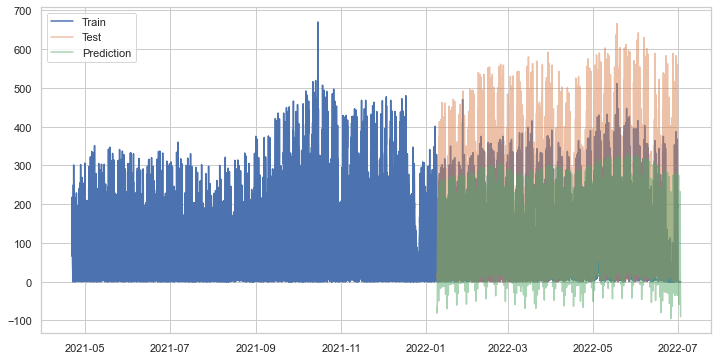

In [60]:
#Plot the train and test data on top the forecast
plt.plot(data_train.set_index('ds')['y'], label='Train')
plt.plot(data_test.set_index('ds')['y'], label='Test',alpha=0.5)
plt.plot(forecast.set_index('ds')['yhat'], label='Prediction',alpha=0.5)
plt.legend()

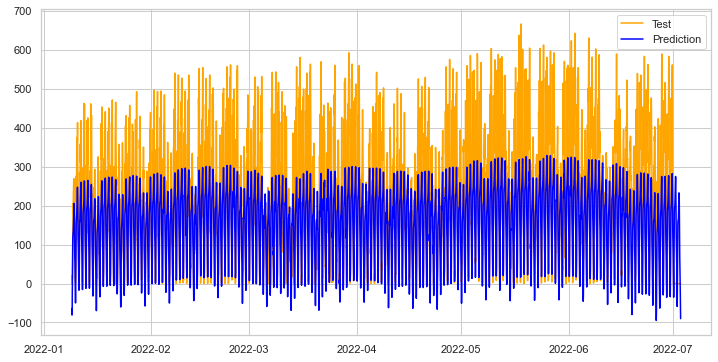

In [61]:
#Plot data test and prediction
fig, ax = plt.subplots()
plt.plot(data_test.set_index('ds')['y'], label='Test',color='orange')
plt.plot(forecast.set_index('ds')['yhat'], label='Prediction',color='blue')
plt.legend()

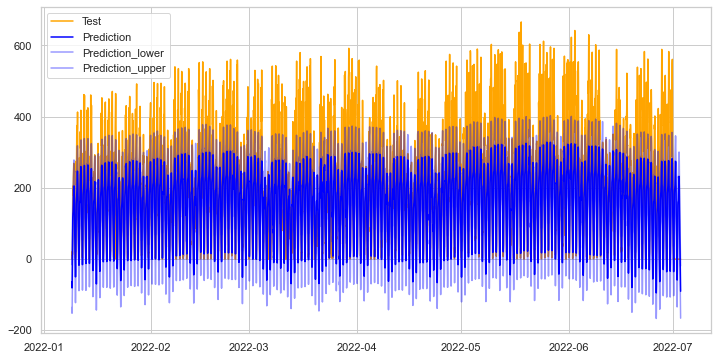

In [62]:
#Plot data test and prediction
fig, ax = plt.subplots()
plt.plot(data_test.set_index('ds')['y'], label='Test',color='orange')
plt.plot(forecast.set_index('ds')['yhat'], label='Prediction',color='blue')
lower=plt.plot(forecast.set_index('ds')['yhat_lower'], label='Prediction_lower',alpha=0.4,color='blue')
upper=plt.plot(forecast.set_index('ds')['yhat_upper'], label='Prediction_upper',alpha=0.4,color='blue')
plt.legend()

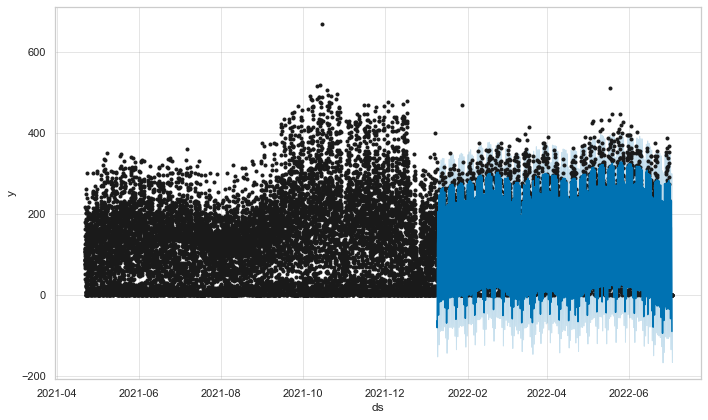

In [63]:
fig1 = m.plot(forecast)

In [64]:
from prophet.plot import plot_plotly, plot_components_plotly

plot_plotly(m, forecast)

In [65]:
plot_components_plotly(m, forecast)

In [66]:
# Cross validation
#Train on the first 200 days, aply to next 5 days and loop each 5 days to reach final data
from prophet.diagnostics import cross_validation

df_cv = cross_validation(m, initial='200 days', period='5 days', horizon = '20 days', parallel="processes")

INFO:prophet:Making 44 forecasts with cutoffs between 2021-11-10 04:00:00 and 2022-06-13 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7ff7130f7520>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -186.747
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -199.869
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -222.665
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -219.497
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -224.584
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -245.222
Initial log joint probability = -252.527
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -259.515
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       20270.9   4.92156e-06       4897.34           1           1      138   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       20937.3 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     102         21368   0.000129924       2771.32   4.265e-08       0.001      177  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     104       22238.8   0.000340012       4970.62   7.366e-08       0.001      171  LS failed, Hessian reset 
     164       20538.7   9.29012e-09       4310.86      0.2658           1      243   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     103         23131   0.000460043        4867.4   9.564e-08       0.001      182  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       22684.5   5.88377e-05       5737.75      0.3286           1      247   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199         20941   1.26933e-05       4267.79           1           1      300   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     187         21370    7.8302e-09       3487.29        0.22        0.22      286   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     195       21834.6   0.000375892       5107.54   7.233e-08       0.001      295  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       21835.9   0.000114376       4429.76           1           1      300   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       22246.6   0.000122811       5000.94           1           1      287   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     206       22684.6   3.34308e-05       4544.91   7.006e-09       0.001      298  LS failed, Hessian reset 
     184       23133.1   9.85604e-09       4148.86      0.2003      0.2003      292   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     236         20941   2.04147e-06       4014.95   4.057e-10       0.001      384  LS failed, Hessian reset 
     265         20941   2.19506e-08       3709.03      0.2273           1      421   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     256       21836.5    6.1102e-07        4288.1   1.375e-10       0.001      416  LS failed, Hessian reset 
     273       22684.9   1.38716e-08       3971.59      0.2515           1      376   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     274       21836.5    1.0574e-08       4222.66     0.03859           1      443   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     299       22257.1   0.000205681       4988.15           1           1      401   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       22260.5   1.52936e-05       4463.97           1           1      527   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     453       22260.5   1.85007e-06       4855.35   4.268e-10       0.001      641  LS failed, Hessian reset 
     475       22260.5   9.88208e-09       3568.19      0.3062      0.3062      671   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -244.88
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -271.796
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -250.365
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -274.821
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23569.2   1.05441e-05       4687.17      0.7671      0.7671      136   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -261.565
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      97       23899.3    0.00118819       4699.95   2.361e-07       0.001      161  LS failed, Hessian reset 
Initial log joint probability = -279.782
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23902.6    0.00126301       5070.13      0.2258           1      164   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24379.4   0.000384259       4768.33           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -258.407
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24875.8   1.08772e-06       4939.63      0.7981      0.7981      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     154       23906.8   8.70219e-09       4499.03      0.4567      0.4567      230   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     199       23574.6   2.20029e-05       4821.38      0.1229           1      268   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     163       24381.5   9.22015e-09       4530.85      0.1916      0.1916      215   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     125       24875.8   2.32682e-08        4860.6           1           1      165   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       25673.7   8.88079e-06       5177.39           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      89       25396.6   0.000892222        4870.3   1.657e-07       0.001      161  LS failed, Hessian reset 
      99       25398.8   3.20087e-05       4614.87           1           1      177   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      91       25935.5   0.000162372        4993.1   2.847e-08       0.001      167  LS failed, Hessian reset 
      99       25935.9   6.50415e-06       3604.92      0.4396      0.4396      175   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     125         25674    2.5009e-05       4839.35   5.007e-09       0.001      199  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -273.239
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       23574.9   2.12924e-06       4104.89   4.204e-10       0.001      437  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     160       25674.1   7.42397e-09       4554.43      0.2718      0.2718      242   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     155       25399.2   2.31602e-05       5117.13   4.936e-09       0.001      287  LS failed, Hessian reset 
     321       23574.9   7.79012e-09       4228.18      0.1765      0.8763      463   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     158       25936.3   9.57281e-09       4860.69      0.2199      0.2199      246   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     197       25399.2   1.34478e-08       4513.57      0.3286      0.3286      342   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      96       26182.2   0.000433676       5572.11   6.916e-08       0.001      185  LS failed, Hessian reset 
      99       26183.5   0.000284467       4556.04           1           1      188   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     178       26185.6   4.00997e-07        4400.7   8.782e-11       0.001      329  LS failed, Hessian reset 
     183       26185.6    1.0947e-07        4042.5      0.2269           1      336   
Optimization terminated normally: 
  Convergence detected: relative change in objective function was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -277.12
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -274.313
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -273.598
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      60       26430.6   0.000214519        4424.4    4.31e-08       0.001      114  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       26708.4   4.93196e-05       4382.19           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       26435.8   3.67485e-05       4599.66      0.3841           1      165   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -292.249
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       26982.8   2.98708e-06       4932.84           1           1      140   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -292.126
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -298.186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     115       26710.1   8.83394e-05       4399.99   2.031e-08       0.001      203  LS failed, Hessian reset 
Initial log joint probability = -293.497
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     137       26982.8   5.59597e-07       4601.02   9.904e-11       0.001      233  LS failed, Hessian reset 
     148       26982.8   3.07958e-08       4084.77      0.1785      0.8405      246   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     188       26439.9   5.45721e-06       4406.36   8.645e-10       0.001      312  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       27237.1   9.63557e-06       4927.99      0.2425      0.5139      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       26439.9   2.92594e-07       4038.79           1           1      325   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       27495.8    4.6759e-05       5013.39      0.3905           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       26714.3   3.11128e-07       4966.84      0.2573           1      309   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     218       26439.9   3.16244e-08       4624.07      0.7544      0.7544      351   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
      99       27763.8   4.48454e-07       4417.04           1           1      124   
    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     131       27237.2   6.25411e-09       4578.04      0.1496      0.1496      174   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     106       27496.3   3.91501e-05       5389.32    8.12e-09       0.001      172  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     207       26714.3   4.74817e-07       4839.58   9.109e-11       0.001      362  LS failed, Hessian reset 
      77       28004.6    0.00574618       10393.2   1.154e-06       0.001      147  LS failed, Hessian reset 
     122       27764.3   0.000120874       5210.57   2.556e-08       0.001      185  LS failed, Hessian reset 
     222       26714.3   1.97042e-08       5257.09     0.06471           1      383   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     147       27496.6   9.93096e-09       4885.98       0.159       0.159      224   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      99       28026.9    0.00146302       5241.03           1           1      170   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -284.649
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     144       28030.5   7.17277e-06       4751.53   1.429e-09       0.001      260  LS failed, Hessian reset 
     174       27765.3   2.35193e-05       5164.72   5.043e-09       0.001      313  LS failed, Hessian reset 
     167       28030.6   2.41269e-08       4348.35      0.2416           1      293   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       28292.2   2.02425e-06       4901.26      0.3946      0.3946      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       27765.6   2.38235e-07        4806.6      0.1695           1      342   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     212       27765.6   8.49129e-09       4785.89      0.2463      0.2463      358   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     118       28292.2   3.98368e-08       4733.74       0.792       0.792      152   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -305.035
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -292.539
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -296.576
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -291.79
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -298.248
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      86       28513.4   0.000316943       5497.43    6.44e-08       0.001      145  LS failed, Hessian reset 
      99       28514.3   3.00523e-06       4900.05      0.3929      0.7829      163   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       28645.6   4.64079e-07       4376.29           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       28869.7   1.15452e-06       4830.79       1.487      0.3996      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     159       28514.4   1.06672e-08       4939.14      0.3099           1      242   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -293.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      62       29015.8   0.000880129       5001.45   1.499e-07       0.001      121  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     128       28645.6   1.19689e-07       4731.08   2.497e-11       0.001      204  LS failed, Hessian reset 
      99       29268.3   4.05036e-06       4766.71           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     136       28645.6   1.61075e-08       4370.13      0.3212           1      214   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -295.822
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -322.926
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       29018.9   4.03644e-06       4756.31           1           1      168   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     117       28869.9   1.48958e-05       5142.98   3.019e-09       0.001      230  LS failed, Hessian reset 
     118       29269.1   8.35385e-05        5257.3    1.78e-08       0.001      187  LS failed, Hessian reset 
     134       29018.9   2.58141e-08        4598.8           1           1      210   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       29511.7   5.80745e-07       4365.34      0.6769      0.6769      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     169       29269.8   1.60444e-08       4378.68      0.5926      0.5926      255   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       29770.2   7.13632e-06       4746.04      0.2135      0.2135      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     170       28870.1   4.08882e-06       4430.14   8.429e-10       0.001      328  LS failed, Hessian reset 
      83       30043.9   0.000244099       5020.95   5.053e-08       0.001      145  LS failed, Hessian reset 
     196       28870.1    9.8404e-09       4600.91      0.3655      0.3655      361   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       30044.9   4.78376e-06       4130.27           1           1      167   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       29513.1   3.48642e-07       4320.74      0.1512      0.1512      248   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     121       30044.9   3.87594e-08       4033.68      0.4141           1      200   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     129       29770.8   3.11022e-05       4818.76   6.336e-09       0.001      222  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     213       29513.1   6.29771e-08       4307.91           1           1      270   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     182         29771    1.6935e-07          4859   3.272e-11       0.001      334  LS failed, Hessian reset 
     189         29771   1.90581e-08        3969.4      0.1764      0.5142      343   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -296.265
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -320.761
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -304.891
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30298.2   1.50537e-06       4181.43      0.8568      0.8568      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99         30549   1.00569e-06       4145.26      0.7764      0.7764      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -310.294
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     126       30298.2   4.00795e-07       4159.75   8.866e-11       0.001      209  LS failed, Hessian reset 
Initial log joint probability = -325.593
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114       30549.1   1.55113e-05       4609.58   3.349e-09       0.001      191  LS failed, Hessian reset 
      99       30813.7   9.12971e-05       4670.77       0.299           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     145       30298.2   1.11959e-08       4352.08      0.1863      0.8902      231   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -316.561
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     144       30549.1   4.98594e-08       3624.93      0.1786           1      231   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -352.214
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     120         30814   5.74944e-06       5100.98   1.264e-09       0.001      186  LS failed, Hessian reset 
      99       31059.2   1.39886e-06       4577.77      0.2767           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     138         30814   2.70462e-08       3852.71      0.2687      0.2687      207   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      89       31308.3   0.000803466       4207.11   1.552e-07       0.001      148  LS failed, Hessian reset 
      99       31309.8   2.14077e-05       3696.63           1           1      160   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -356.753
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       31556.2   0.000215681       4882.55   4.564e-08       0.001      146  LS failed, Hessian reset 
     169       31059.3   2.71785e-08       4427.02      0.4496      0.4496      237   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
      99       31557.2   9.93788e-05       4508.64           1           1      153   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       31781.2   0.000241604       4970.03   4.743e-08       0.001      169  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     190       31312.3   1.63885e-08       3888.73     0.05017           1      274   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     175       31557.5   4.23558e-07       4267.56    8.47e-11       0.001      291  LS failed, Hessian reset 
     185       31557.5   9.98491e-09       4701.19      0.3166      0.3166      304   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      96       32024.7   0.000304543       4276.74   5.167e-08       0.001      181  LS failed, Hessian reset 
      99       32025.2   3.34765e-05       4251.51       0.447       0.447      184   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     178       31782.5   4.30157e-05       4760.32   8.112e-09       0.001      305  LS failed, Hessian reset 
     199       31782.7   1.96993e-07       4579.46      0.4077      0.4077      332   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     165       32026.5   2.99775e-08       4432.95           1           1      265   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -351.889
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     245       31782.7   5.43446e-09       4814.54       0.225       0.225      391   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Initial log joint probability = -364.044
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -368.653
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99         32259   4.63931e-06       4652.48      0.2494           1      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -368.187
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32500.4   7.25776e-06       4531.02      0.4427      0.4427      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     137         32259   1.65501e-08       4561.06       0.144       0.664      185   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       32756.6    0.00018717          4834   3.936e-08       0.001      155  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     129         32503   0.000224681       4448.27   4.487e-08       0.001      214  LS failed, Hessian reset 
      99       32973.7   0.000372318       4785.91           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     104       32975.7   0.000460531       4471.22    8.41e-08       0.001      171  LS failed, Hessian reset 
     199       32505.5   9.08128e-06       5227.05      0.3419           1      301   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     149       32757.6   1.22791e-05       5042.47    2.59e-09       0.001      262  LS failed, Hessian reset 
     201       32505.5   1.63336e-06        5144.7   3.109e-10       0.001      345  LS failed, Hessian re

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     148       32977.2   3.93347e-05       5470.85   7.997e-09       0.001      264  LS failed, Hessian reset 
     186       32977.5   1.12225e-08       4705.74      0.4035           1      314   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

In [67]:
df_cv.head()

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2021-11-10 05:00:00,14.225094,-51.037578,78.863516,13,2021-11-10 04:00:00
1,2021-11-10 05:00:00,14.225094,-51.484489,80.774400,11,2021-11-10 04:00:00
2,2021-11-10 06:00:00,63.522355,-2.928683,125.204059,38,2021-11-10 04:00:00
3,2021-11-10 06:00:00,63.522355,-3.773565,127.802576,20,2021-11-10 04:00:00
4,2021-11-10 07:00:00,123.594349,60.688718,186.712093,150,2021-11-10 04:00:00


In [68]:
from prophet.diagnostics import performance_metrics
df_p = performance_metrics(df_cv)
df_p.head()

INFO:prophet:Skipping MAPE because y close to 0


,horizon,mse,rmse,mae,mdape,smape,coverage
0,1 days 23:00:00,3876.603117,62.262373,46.248137,0.285199,0.492337,0.773047
1,2 days 00:00:00,3878.527775,62.277827,46.244703,0.282828,0.500491,0.772699
2,2 days 01:00:00,3866.635091,62.182273,46.028876,0.284734,0.510178,0.774010
3,2 days 02:00:00,3761.217610,61.328767,45.454435,0.286644,0.519158,0.780019
4,2 days 03:00:00,3539.520082,59.493866,44.285493,0.284734,0.519303,0.790597


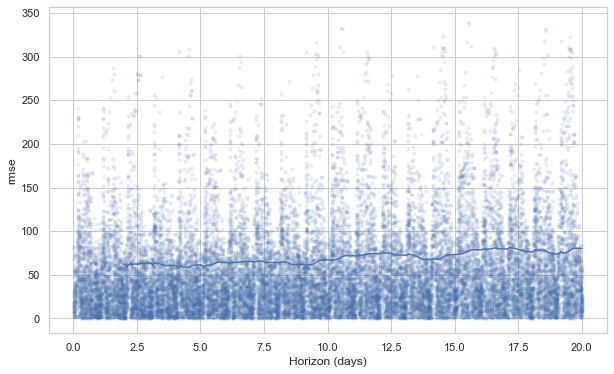

In [69]:
from prophet.plot import plot_cross_validation_metric

fig = plot_cross_validation_metric(df_cv, metric='rmse')

In [70]:
#calculate Root Mean Square  Error(RMSE)
from math import sqrt
from sklearn.metrics import mean_squared_error

rms = sqrt(mean_squared_error(data_test['y'],forecast['yhat']))

print('The root mean square error score for the model is: ', rms)

The root mean square error score for the model is:  117.17939926741622
